## Motor Fault Detection

In [1]:
# Importing numpy and pandas
import numpy as np
import pandas as pd

# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
TD_features_acpe = pd.read_csv(r"G:/Research/Python/Data/TD_features_acpe.csv", sep=",",header=0,encoding = "ISO-8859-1",)
TD_features_acpe.shape

(399, 14)

In [3]:
TD_features_acpe.head()

,Mean,Median,Standard Deviation,Variance,Skewness,Kurtosis,RMS,Peak,Peak to Peak,Shape Factor,Root-sum-of-square,Peak-magnitude-to-RMS ratio,Torque,Status
0,0.195833,0.277710,3.648883,13.314349,-0.085321,12.066211,3.654123,28.14636,56.06994,18.659418,1431.670141,7.702631,5,0
1,0.195832,0.231934,3.660153,13.396718,-0.118907,10.359006,3.665376,33.12683,63.87939,18.716939,1436.079128,9.037772,5,0
2,0.198418,0.265503,3.997891,15.983133,-0.108511,14.113159,4.002799,36.03516,71.25855,20.173600,1568.280017,9.002491,5,0
3,0.197908,0.247192,3.490730,12.185196,-0.010963,8.236702,3.496324,28.09753,62.07580,17.666444,1369.845416,9.718283,5,0
4,0.196435,0.241089,3.823409,14.618454,-0.129097,11.408154,3.828439,28.95813,61.11145,19.489583,1499.966573,8.398546,5,0


In [4]:
TD_features_acpe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Mean                         399 non-null    float64
 1   Median                       399 non-null    float64
 2   Standard Deviation           399 non-null    float64
 3   Variance                     399 non-null    float64
 4   Skewness                     399 non-null    float64
 5   Kurtosis                     399 non-null    float64
 6   RMS                          399 non-null    float64
 7   Peak                         399 non-null    float64
 8   Peak to Peak                 399 non-null    float64
 9   Shape Factor                 399 non-null    float64
 10  Root-sum-of-square           399 non-null    float64
 11  Peak-magnitude-to-RMS ratio  399 non-null    float64
 12  Torque                       399 non-null    int64  
 13  Status              

In [5]:
# Reading time domain feature 
TD_features_acpi = pd.read_csv(r"G:/Research/Python/Data/TD_features_acpi.csv", sep=",",header=0,encoding = "ISO-8859-1",)
TD_features_axial = pd.read_csv(r"G:/Research/Python/Data/TD_features_axial.csv", sep=",",header=0,encoding = "ISO-8859-1",)
TD_features_base = pd.read_csv(r"G:/Research/Python/Data/TD_features_base.csv", sep=",",header=0,encoding = "ISO-8859-1",)
TD_features_carc = pd.read_csv(r"G:/Research/Python/Data/TD_features_carc.csv", sep=",",header=0,encoding = "ISO-8859-1",)

In [6]:
# Reading time domain feature 
FD_features_acpe = pd.read_csv(r"G:/Research/Python/Data/FD_features_acpe.csv", sep=",",header=0,encoding = "ISO-8859-1",)
FD_features_acpi = pd.read_csv(r"G:/Research/Python/Data/FD_features_acpi.csv", sep=",",header=0,encoding = "ISO-8859-1",)
FD_features_axial = pd.read_csv(r"G:/Research/Python/Data/FD_features_axial.csv", sep=",",header=0,encoding = "ISO-8859-1",)
FD_features_base = pd.read_csv(r"G:/Research/Python/Data/FD_features_base.csv", sep=",",header=0,encoding = "ISO-8859-1",)
FD_features_carc = pd.read_csv(r"G:/Research/Python/Data/FD_features_carc.csv", sep=",",header=0,encoding = "ISO-8859-1",)

In [7]:
#Replaing conditions with text for better plotting
def replace_int(df):
    df=df.replace({"Status" : {0 : "Healthy", 1 : "1BRB", 2 : "2BRB", 3 : "3BRB", 4: "4BRB"}})
    df=df.replace({"Torque" : {5 : "5Nm", 10 : "10Nm", 15 : "15Nm", 20 : "20Nm", 25: "25Nm",
                                     30 : "30Nm", 35 : "35Nm", 40 : "40Nm"}})
    df['Motor Condition'] = np.where(df['Status'] == 'Healthy', 'Healthy', 'Faulty')
    return df

In [8]:
TD_features_acpe=replace_int(TD_features_acpe)
TD_features_acpi=replace_int(TD_features_acpi)
TD_features_axial=replace_int(TD_features_axial)
TD_features_base=replace_int(TD_features_base)
TD_features_carc=replace_int(TD_features_carc)

In [9]:
FD_features_acpe=replace_int(FD_features_acpe)
FD_features_acpi=replace_int(FD_features_acpi)
FD_features_axial=replace_int(FD_features_axial)
FD_features_base=replace_int(FD_features_base)
FD_features_carc=replace_int(FD_features_carc)

In [10]:
TD_features_acpe.head()

,Mean,Median,Standard Deviation,Variance,Skewness,Kurtosis,RMS,Peak,Peak to Peak,Shape Factor,Root-sum-of-square,Peak-magnitude-to-RMS ratio,Torque,Status,Motor Condition
0,0.195833,0.277710,3.648883,13.314349,-0.085321,12.066211,3.654123,28.14636,56.06994,18.659418,1431.670141,7.702631,5Nm,Healthy,Healthy
1,0.195832,0.231934,3.660153,13.396718,-0.118907,10.359006,3.665376,33.12683,63.87939,18.716939,1436.079128,9.037772,5Nm,Healthy,Healthy
2,0.198418,0.265503,3.997891,15.983133,-0.108511,14.113159,4.002799,36.03516,71.25855,20.173600,1568.280017,9.002491,5Nm,Healthy,Healthy
3,0.197908,0.247192,3.490730,12.185196,-0.010963,8.236702,3.496324,28.09753,62.07580,17.666444,1369.845416,9.718283,5Nm,Healthy,Healthy
4,0.196435,0.241089,3.823409,14.618454,-0.129097,11.408154,3.828439,28.95813,61.11145,19.489583,1499.966573,8.398546,5Nm,Healthy,Healthy


In [11]:
TD_features_acpe.tail()

,Mean,Median,Standard Deviation,Variance,Skewness,Kurtosis,RMS,Peak,Peak to Peak,Shape Factor,Root-sum-of-square,Peak-magnitude-to-RMS ratio,Torque,Status,Motor Condition
394,0.195954,0.204468,12.812247,164.153686,-0.047596,1.845038,12.813704,36.55396,78.33558,65.391243,4998.330053,3.260698,40Nm,4BRB,Faulty
395,0.202722,0.259399,13.049771,170.296519,-0.061746,1.676004,13.051300,34.16443,72.43652,64.380429,4927.777369,2.932435,40Nm,4BRB,Faulty
396,0.208843,0.247192,13.053046,170.382021,-0.061307,1.663244,13.054671,32.42493,68.84156,62.509522,4929.050411,2.789548,40Nm,4BRB,Faulty
397,0.202831,0.201416,12.728742,162.020878,-0.036480,1.850478,12.730316,35.14709,81.24389,62.763075,4965.802519,3.621026,40Nm,4BRB,Faulty
398,0.203821,0.207519,12.867537,165.573498,-0.038769,1.874767,12.869108,43.72253,83.88061,63.139358,5019.942143,3.397479,40Nm,4BRB,Faulty


In [12]:
def tdpairplot(df,title):
    sns.pairplot(data=df[['Mean','Median','Standard Deviation','Variance','Skewness','Kurtosis','Motor Condition']],hue='Motor Condition')
    plt.savefig(title+"_1.jpg")
    sns.pairplot(data=df[['RMS','Peak','Peak to Peak','Shape Factor','Root-sum-of-square','Peak-magnitude-to-RMS ratio','Motor Condition']],hue='Motor Condition')
    plt.savefig(title+"_2.jpg")

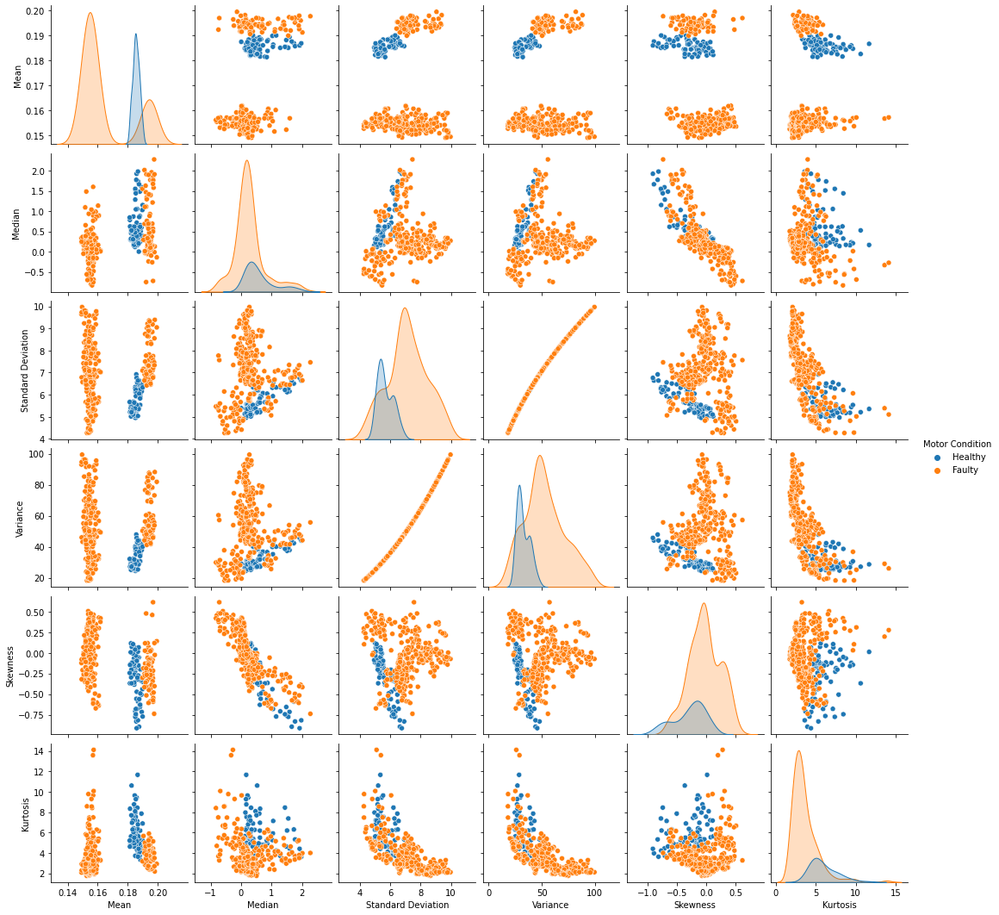

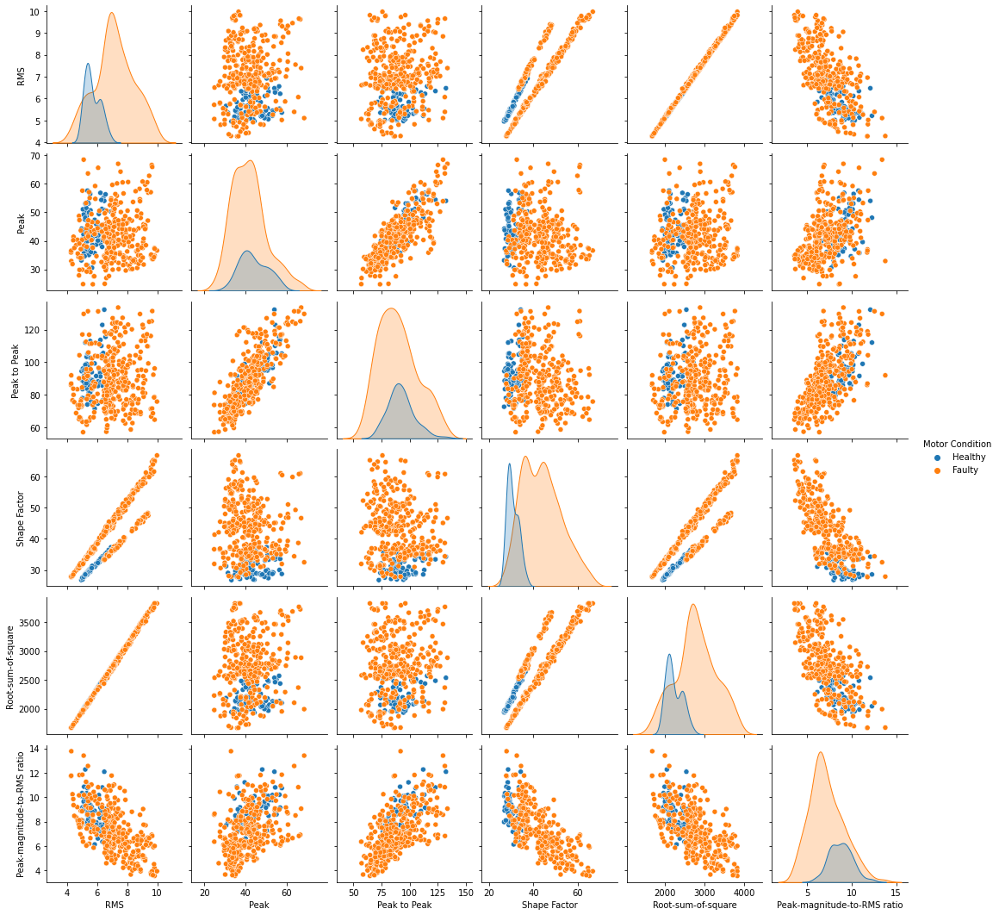

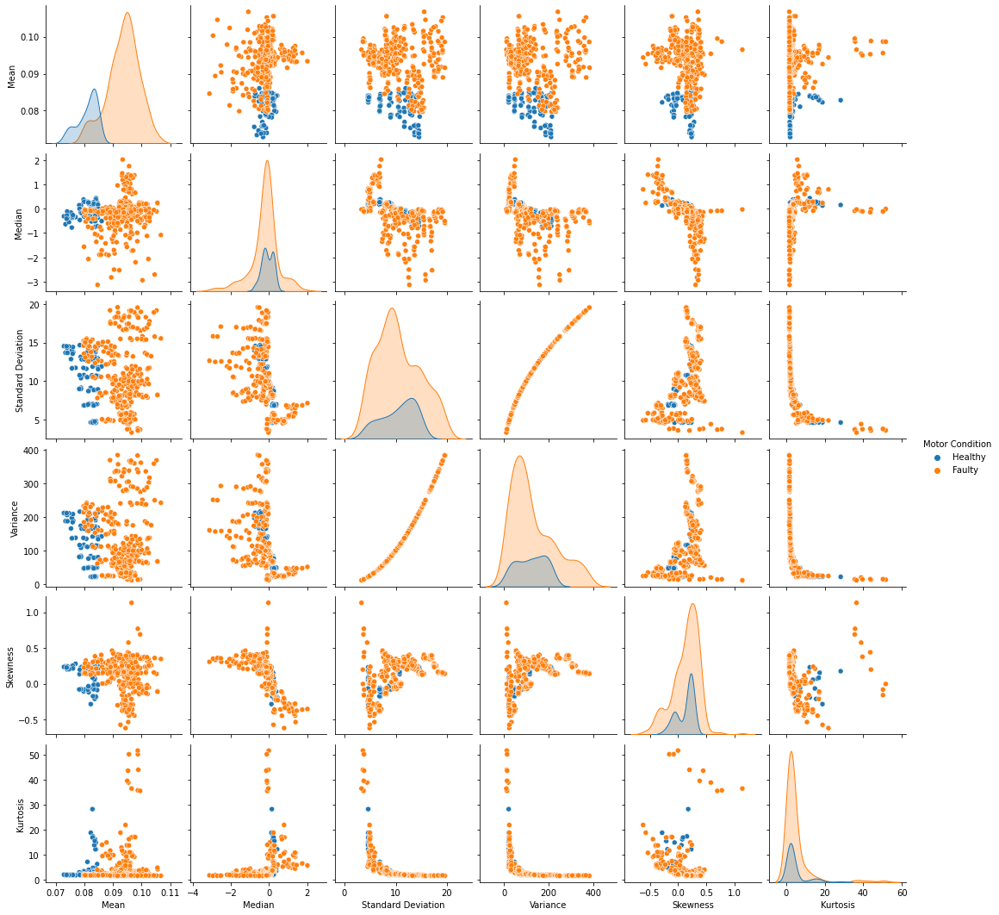

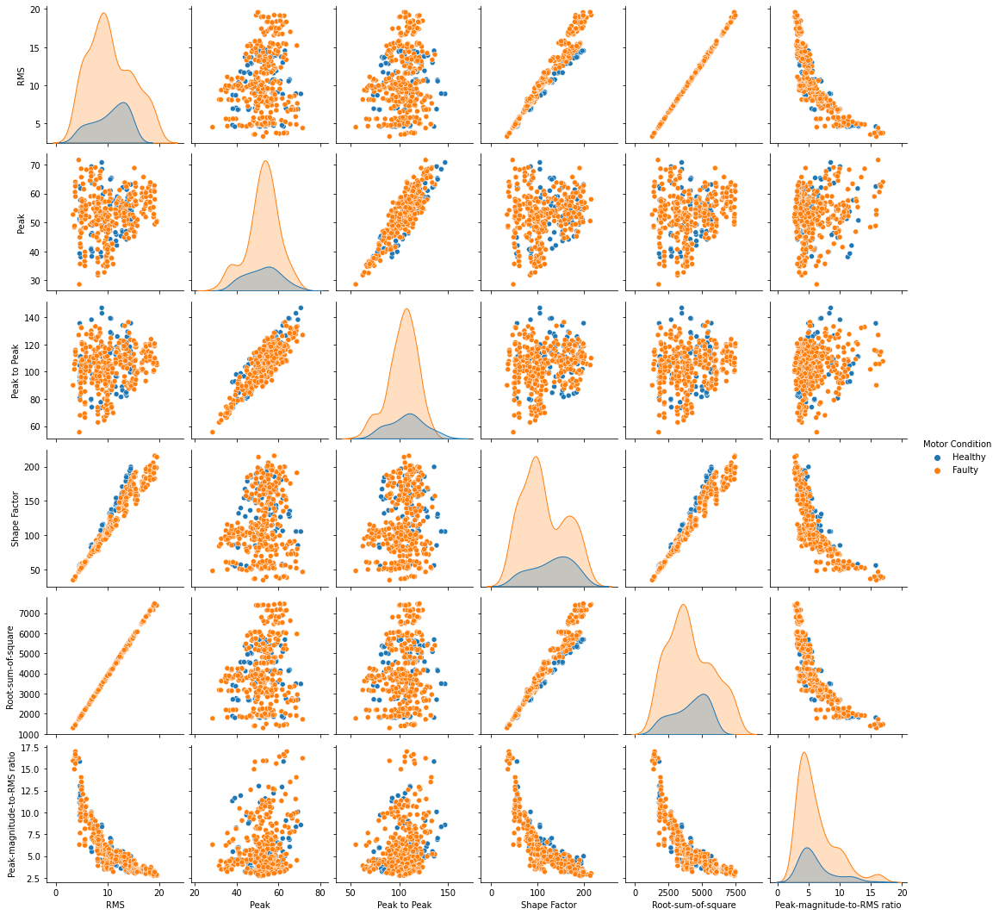

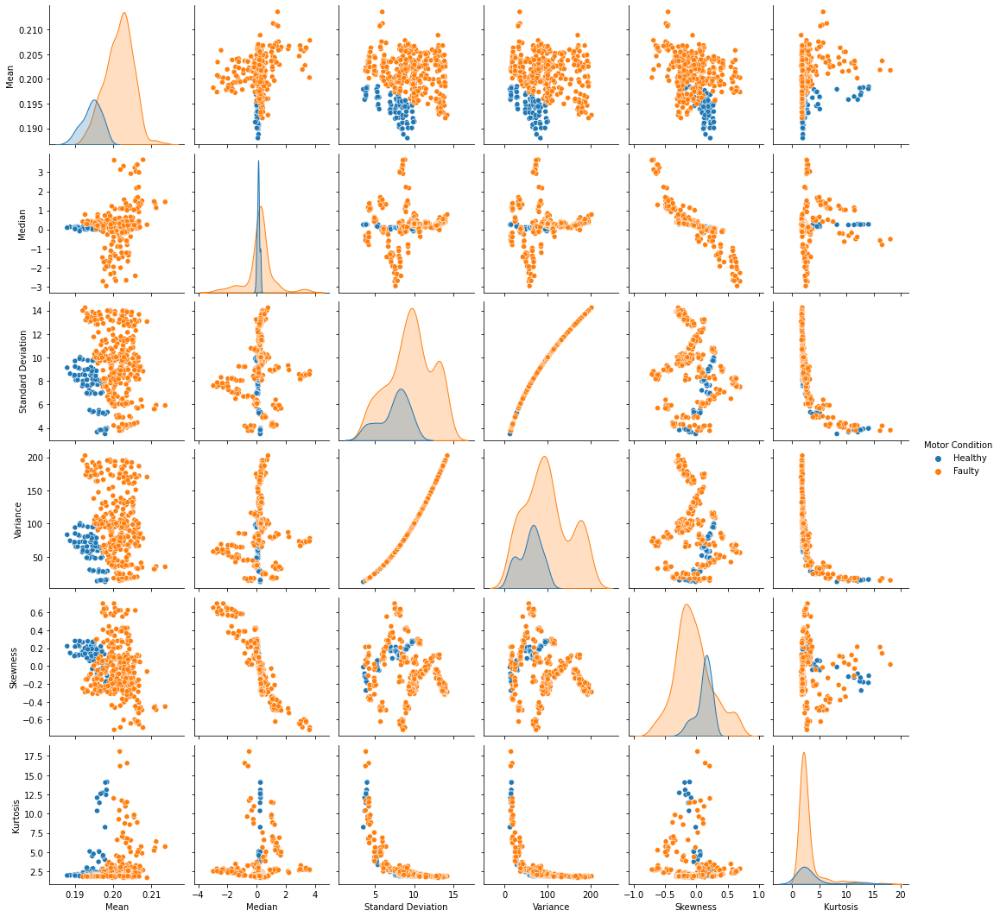

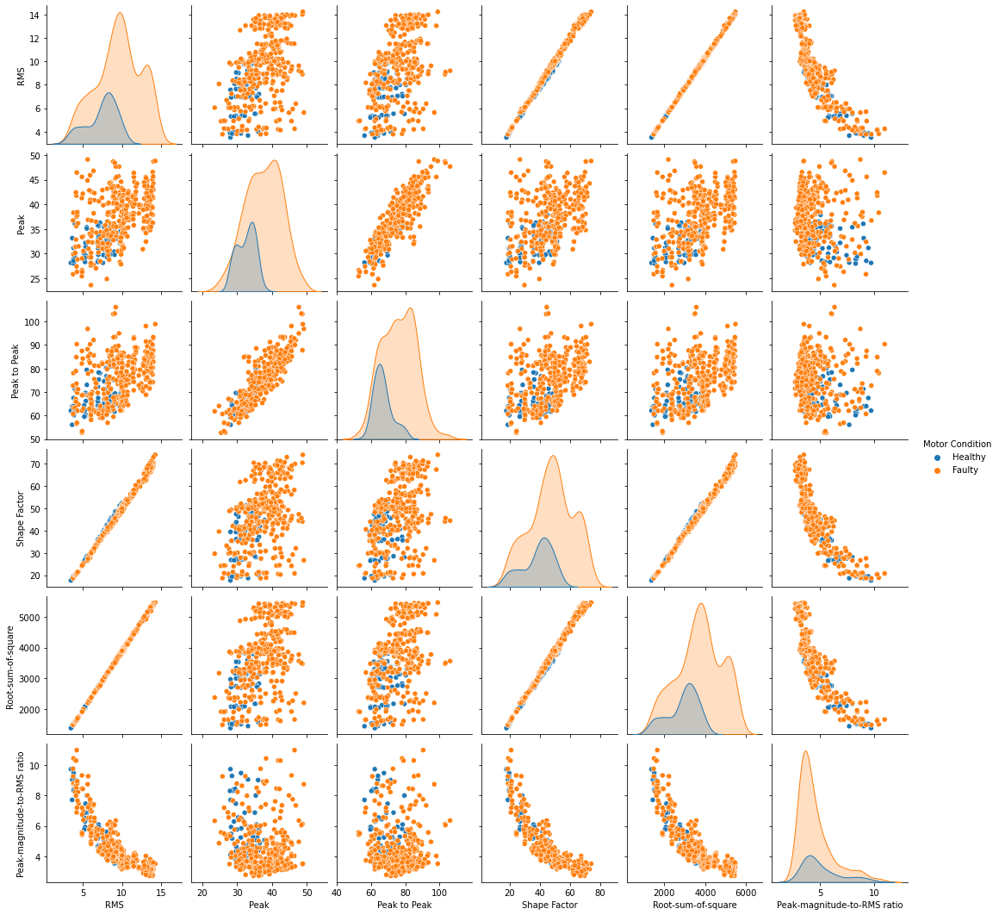

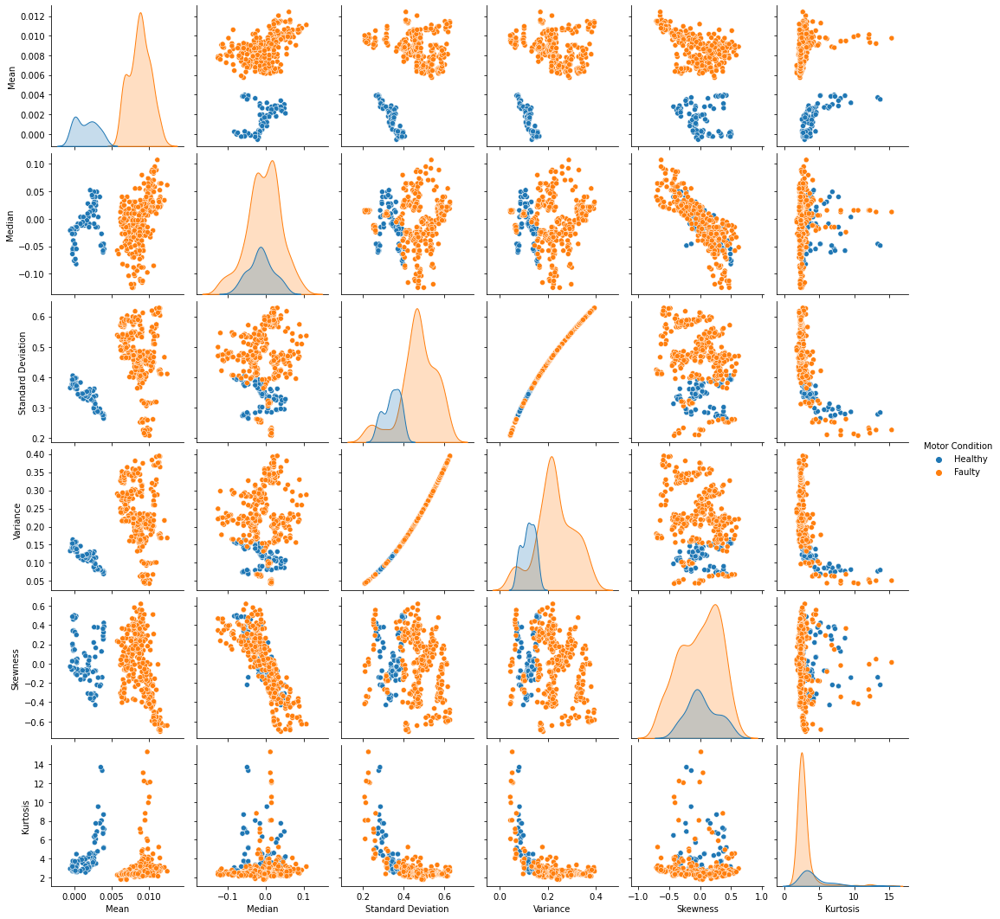

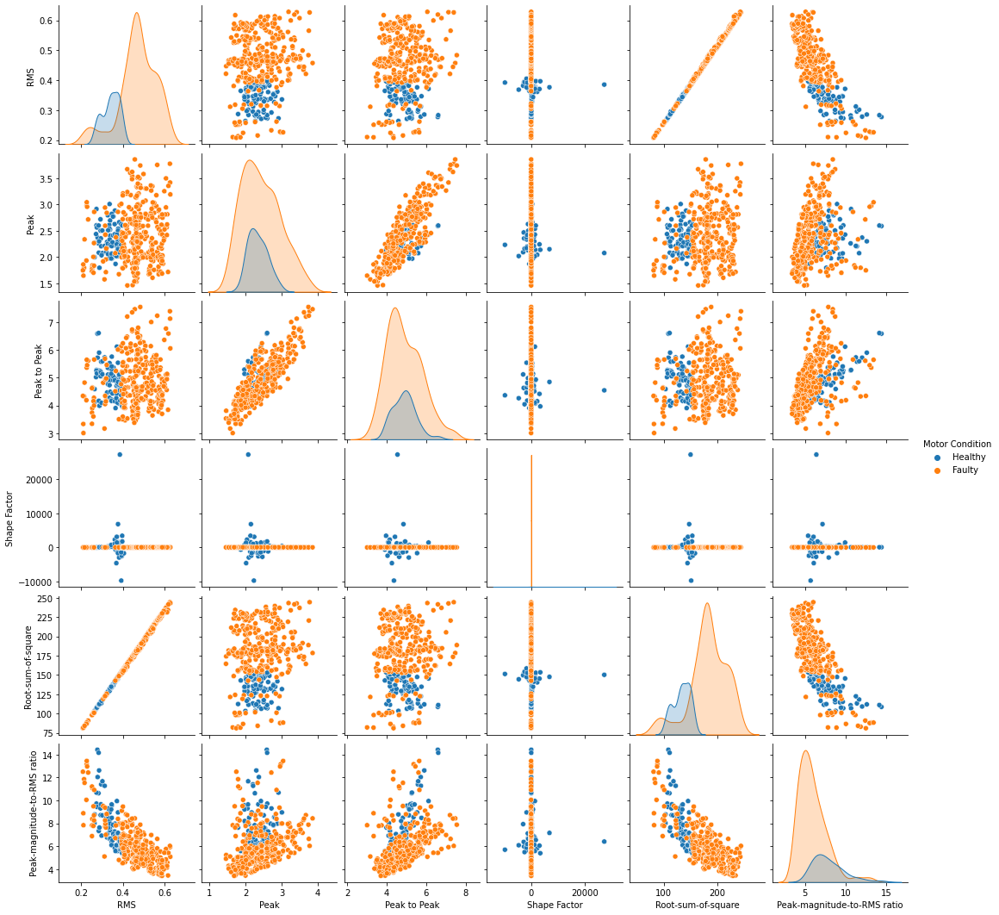

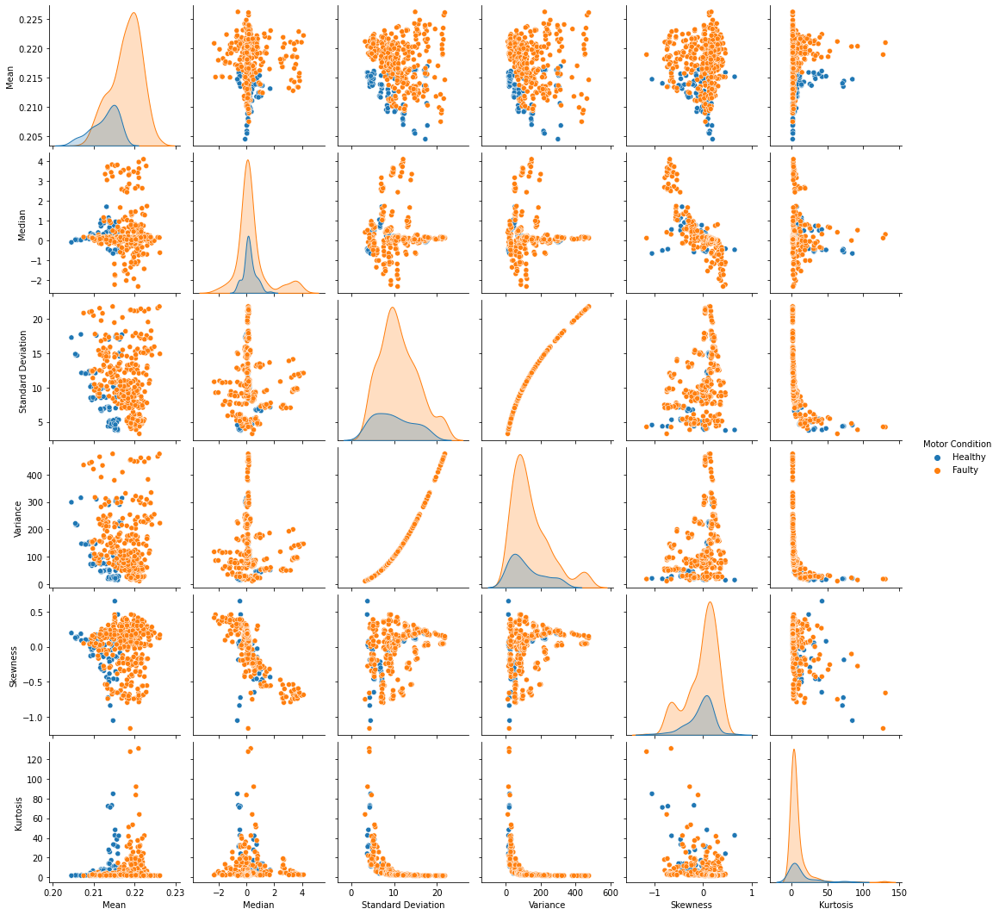

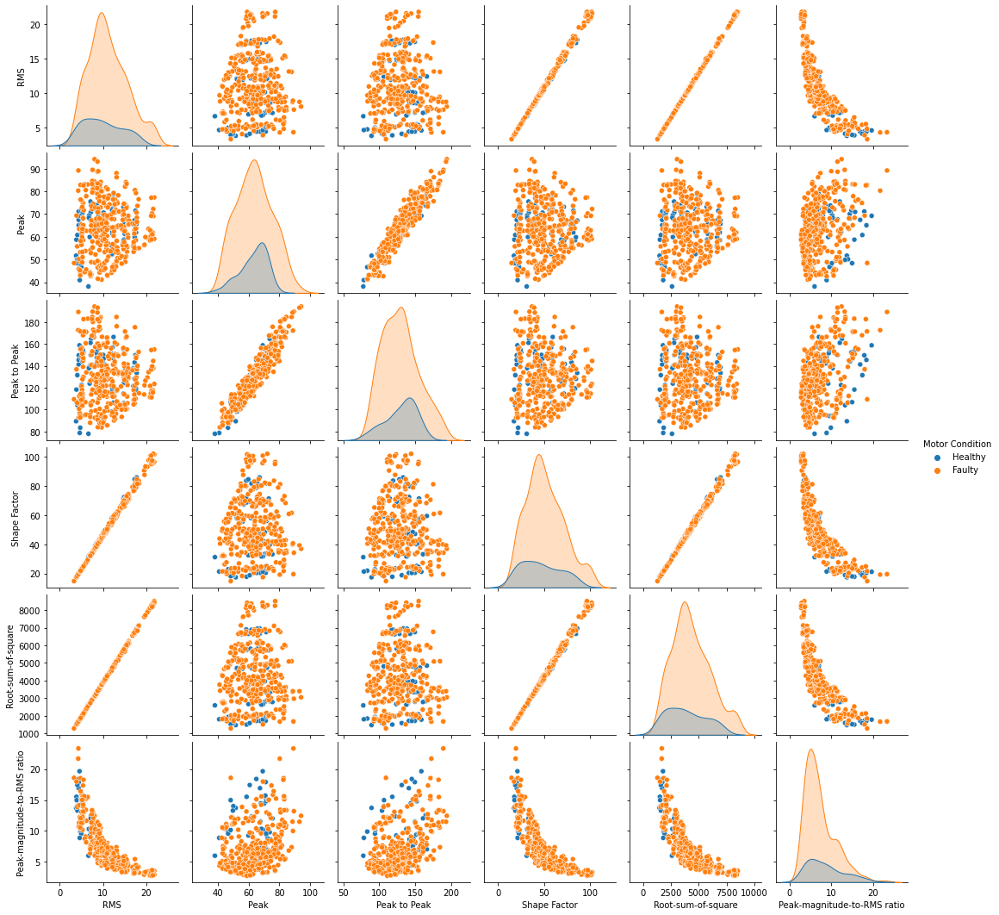

In [13]:
#Plotting time domain feature 
tdpairplot(TD_features_acpi,'Radial mechanical vibration on driven side')
tdpairplot(TD_features_carc,'Tangential mechanical vibration on driven side')
tdpairplot(TD_features_acpe,'Radial mechanical vibration on non-driven side')
tdpairplot(TD_features_axial,'Axial mechanical vibration on non-driven side')
tdpairplot(TD_features_base,'Tangential mechanical vibration on non-driven side')

In [14]:
def plotvstorque(df,title):
    plt.figure(figsize=(12,18))
    plt.subplot(3, 2, 1)
    sns.scatterplot(x="Mean", y= 'Torque', hue="Status", data=df);
    plt.title("Mean Vs Torque")

    plt.subplot(3, 2, 2)
    sns.scatterplot(x="Median", y= 'Torque', hue="Status", data=df);
    plt.title("Median Vs Torque")

    plt.subplot(3, 2, 3)
    sns.scatterplot(x="Standard Deviation", y= 'Torque', hue="Status", data=df);
    plt.title("Standard Deviation Vs Torque")

    plt.subplot(3, 2, 4)
    sns.scatterplot(x="Variance", y= 'Torque', hue="Status", data=df);
    plt.title("Variance Vs Torque")

    plt.subplot(3, 2, 5)
    sns.scatterplot(x="Skewness", y= 'Torque', hue="Status", data=df);
    plt.title("Skewness Vs Torque")

    plt.subplot(3, 2, 6)
    sns.scatterplot(x="Kurtosis", y= 'Torque', hue="Status", data=df);
    plt.title("Kurtosis Vs Torque")
    plt.savefig(title+" differnt loading_1.jpg")

    plt.figure(figsize=(12,18))
    plt.subplot(3, 2, 1)
    sns.scatterplot(x="RMS", y= 'Torque', hue="Status", data=df);
    plt.title("RMS Vs Torque")

    plt.subplot(3, 2, 2)
    sns.scatterplot(x="Peak", y= 'Torque', hue="Status", data=df);
    plt.title("Peak Vs Torque")

    plt.subplot(3, 2, 3)
    sns.scatterplot(x="Peak to Peak", y= 'Torque', hue="Status", data=df);
    plt.title("Peak to Peak Vs Torque")

    plt.subplot(3, 2, 4)
    sns.scatterplot(x="Shape Factor", y= 'Torque', hue="Status", data=df);
    plt.title("Shape Factor Vs Torque")

    plt.subplot(3, 2, 5)
    sns.scatterplot(x="Root-sum-of-square", y= 'Torque', hue="Status", data=df);
    plt.title("Root-sum-of-square Vs Torque")

    plt.subplot(3, 2, 6)
    sns.scatterplot(x="Peak-magnitude-to-RMS ratio", y= 'Torque', hue="Status", data=df);
    plt.title("Peak-magnitude-to-RMS ratio Vs Torque")
    plt.savefig(title+" differnt loading_2.jpg")

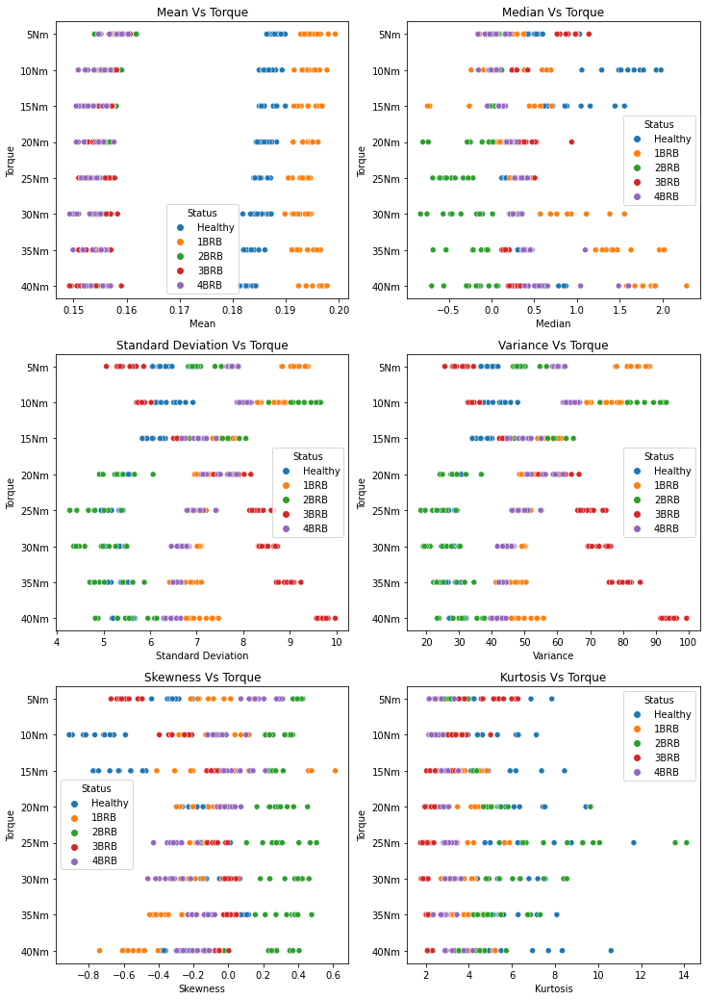

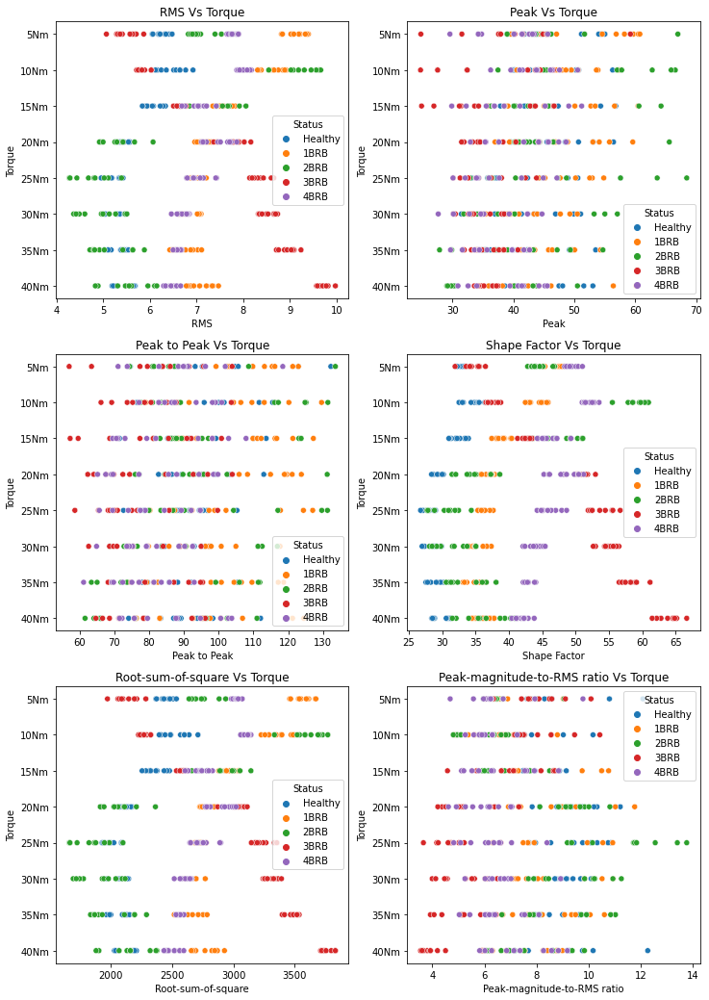

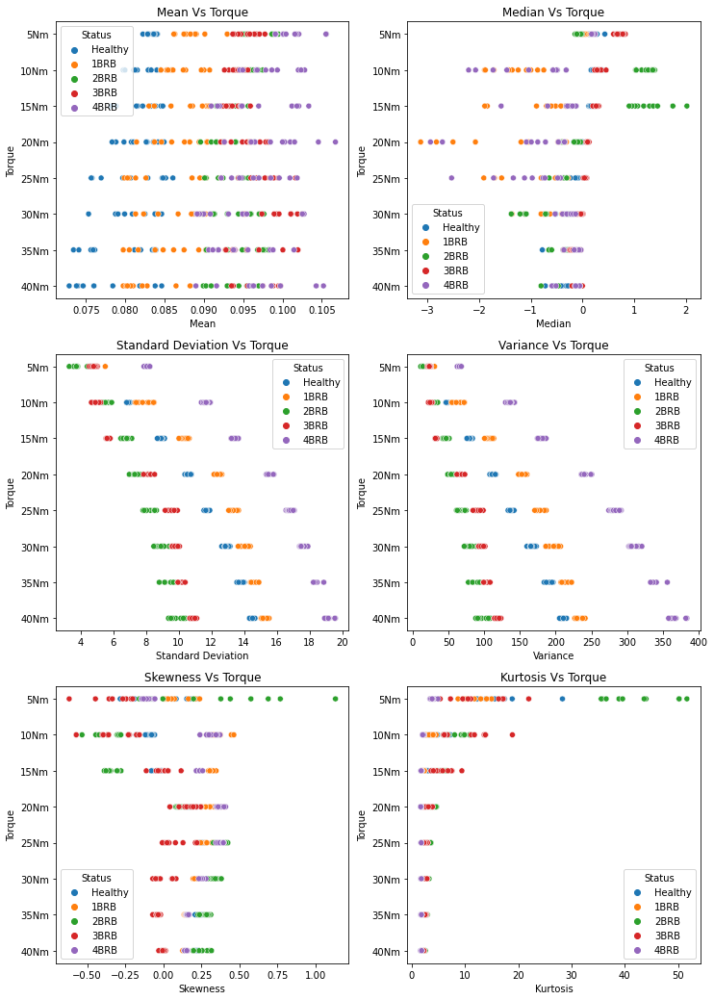

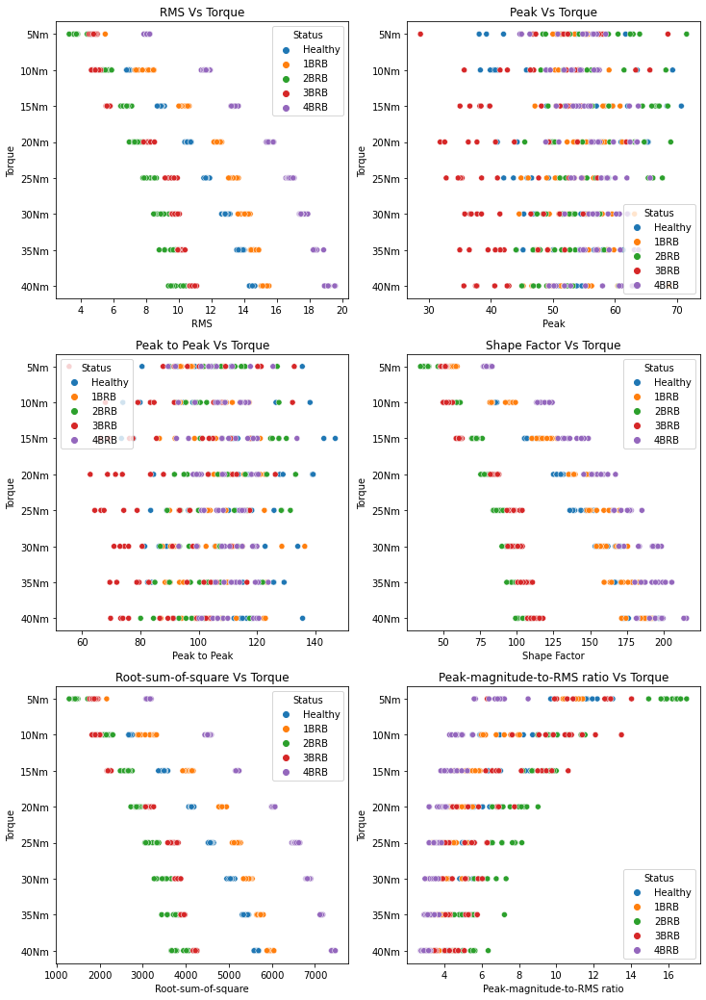

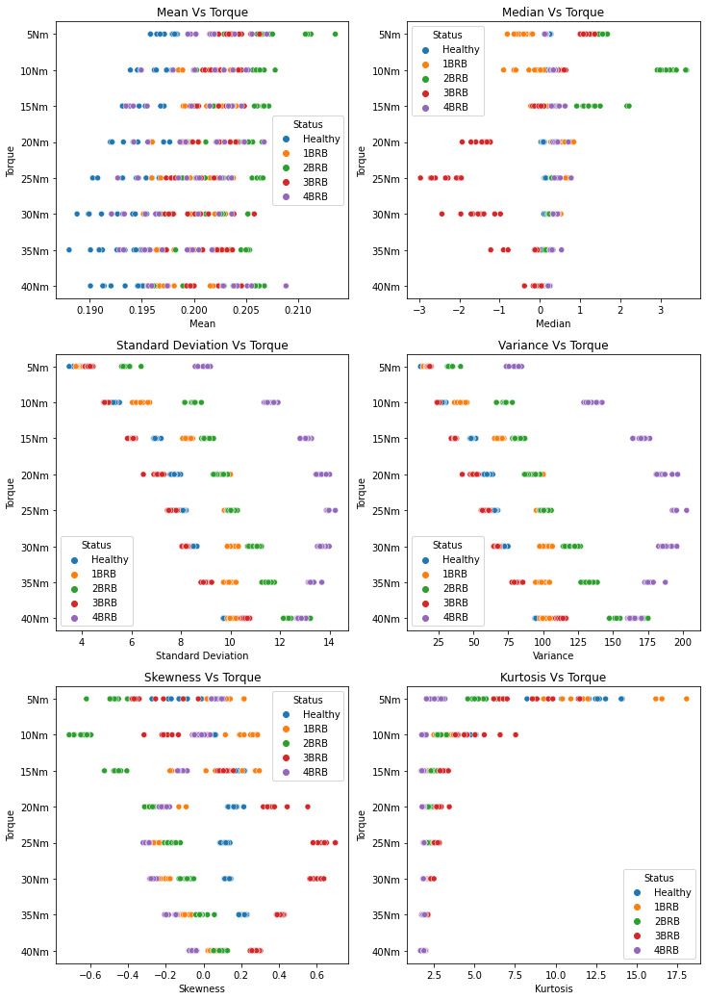

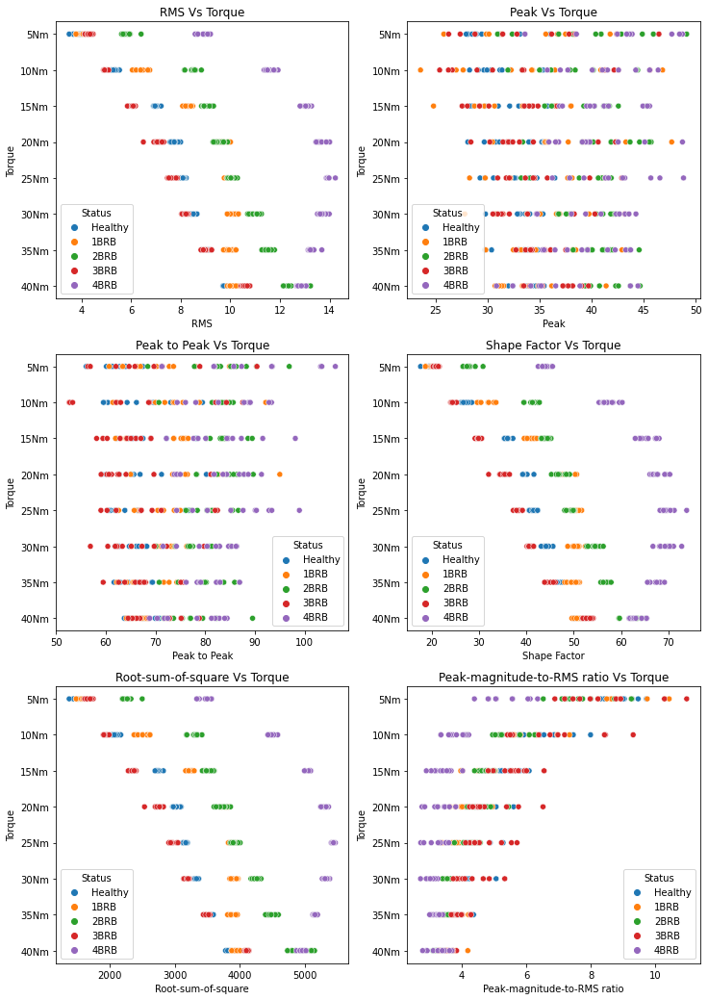

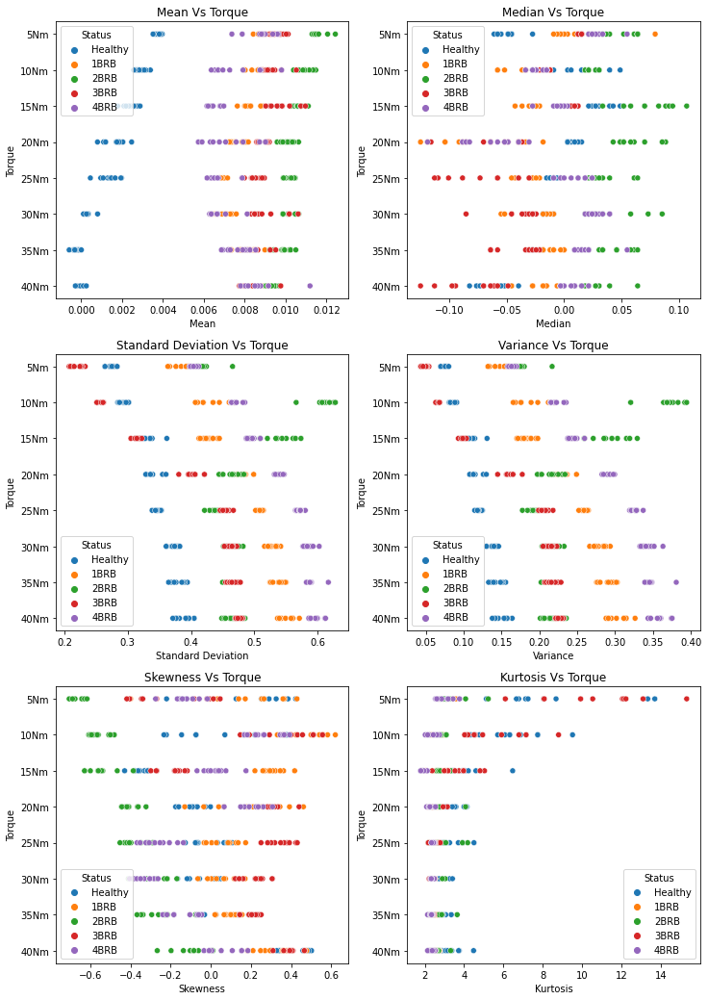

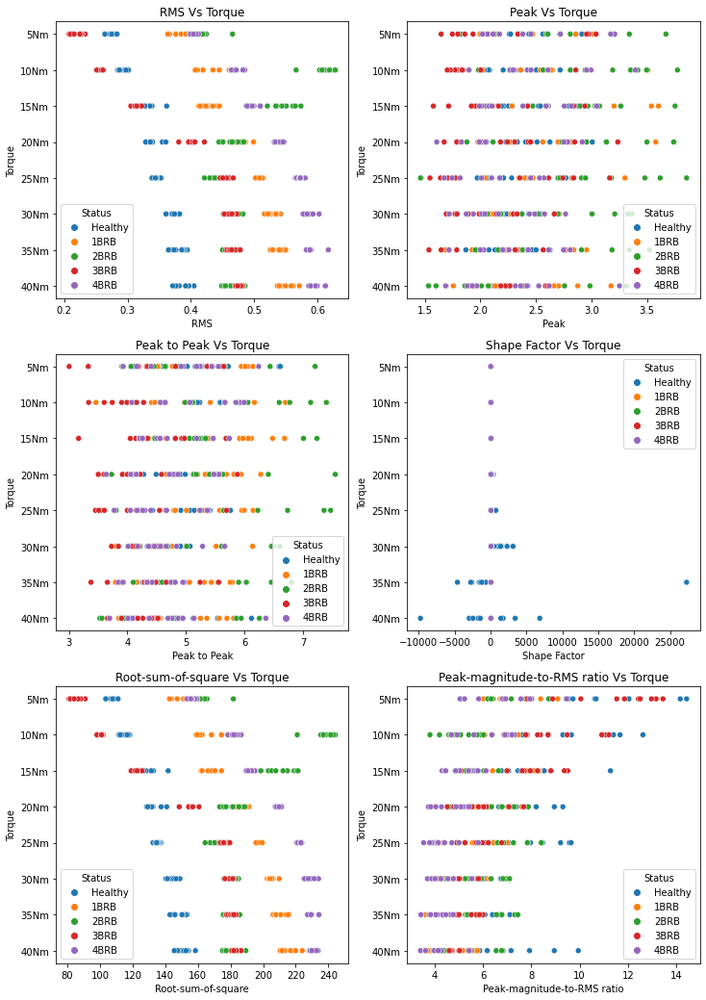

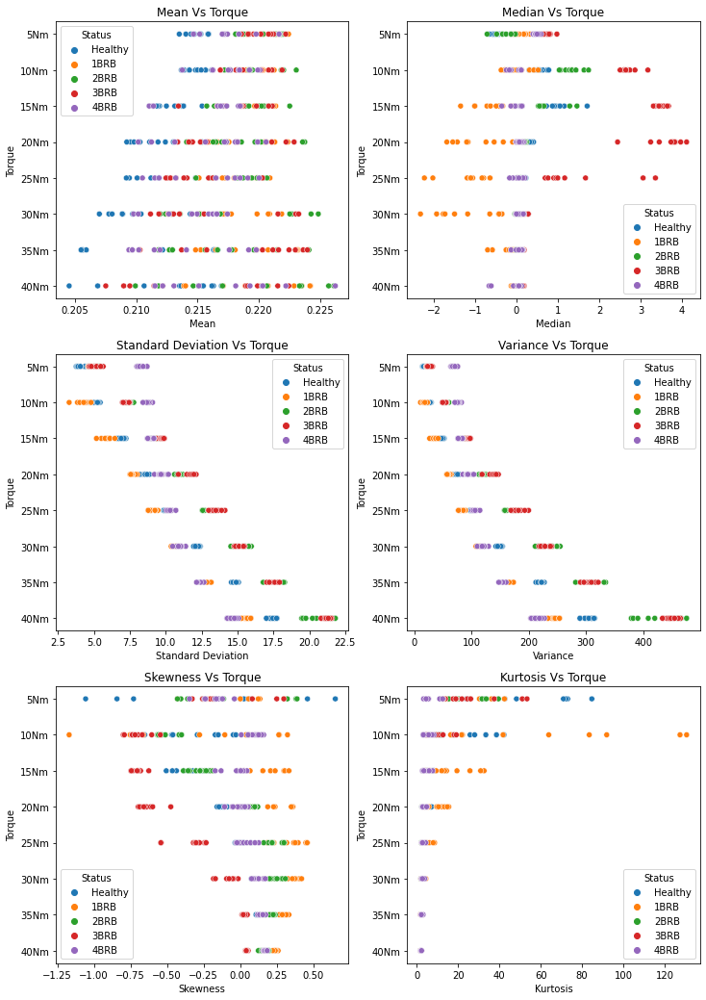

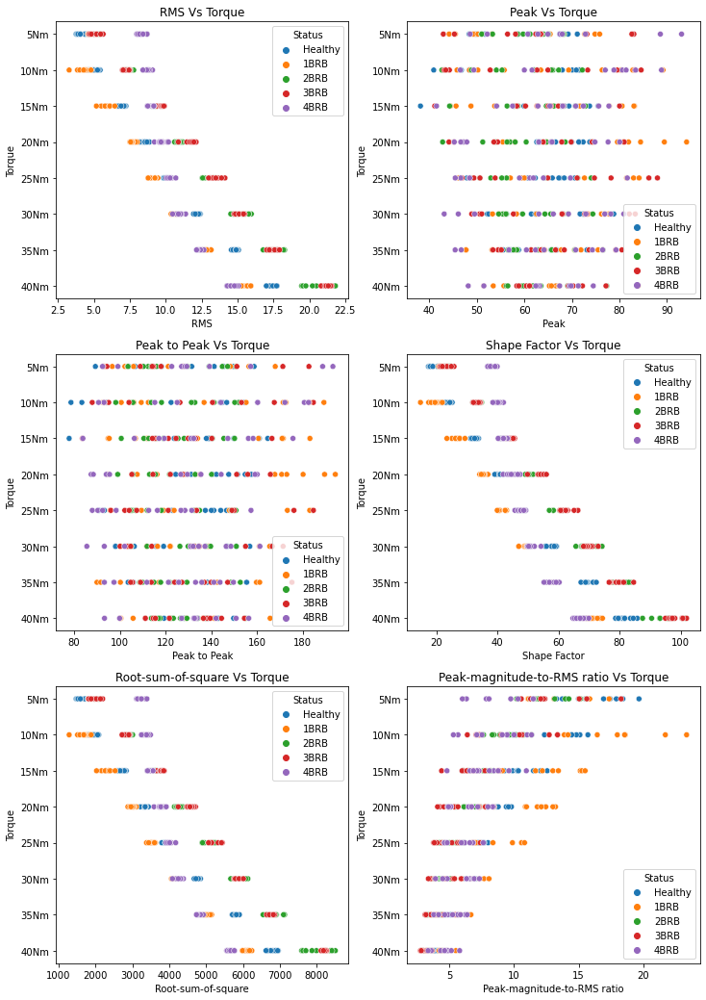

In [15]:
#Time doamin feature scatter plot against torque
plotvstorque(TD_features_acpi,'Radial mechanical vibration on driven side')
plotvstorque(TD_features_carc,'Tangential mechanical vibration on driven side')
plotvstorque(TD_features_acpe,'Radial mechanical vibration on non-driven side')
plotvstorque(TD_features_axial,'Axial mechanical vibration on non-driven side')
plotvstorque(TD_features_base,'Tangential mechanical vibration on non-driven side')

In [16]:
def fqpairplot(df,title):
    sns.pairplot(data=df[['Mean','Standard Deviation','Variance','Skewness','Kurtosis','Motor Condition']],hue='Motor Condition')
    plt.savefig(title+"_1.jpg")
    sns.pairplot(data=df[['RMS','Peak','Peak to Peak','Shape Factor','Crest Factor','Motor Condition']],hue='Motor Condition')
    plt.savefig(title+"_2.jpg")

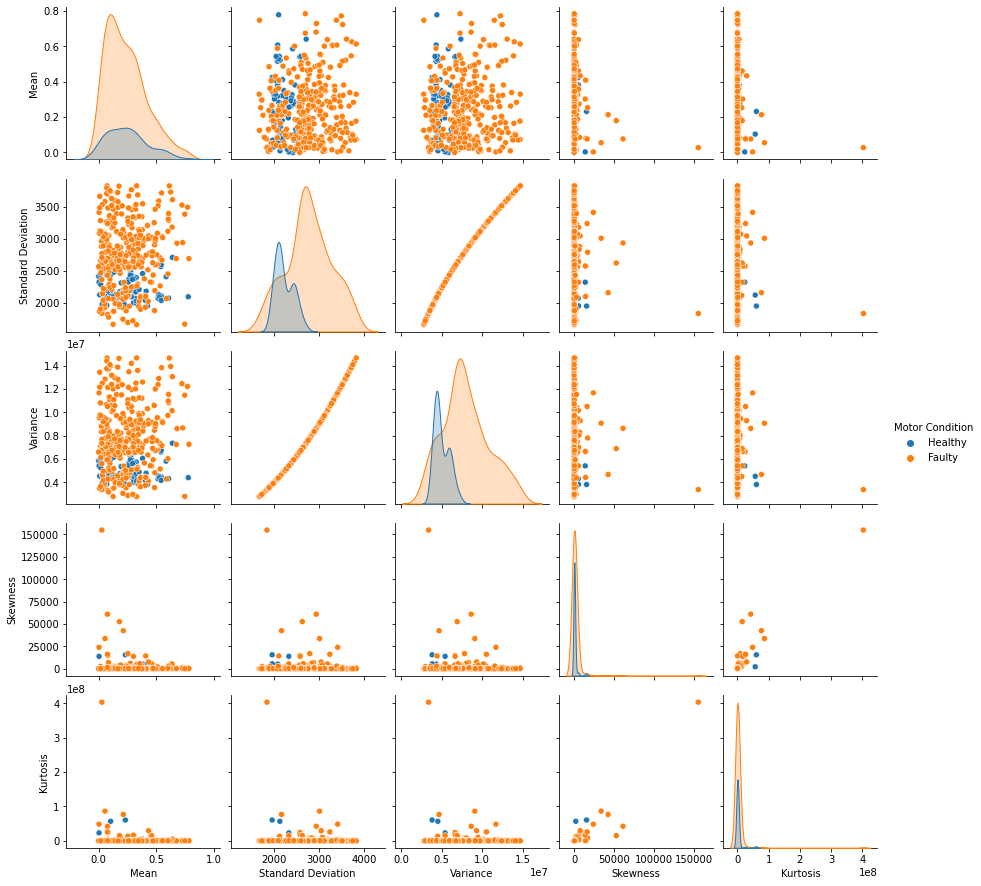

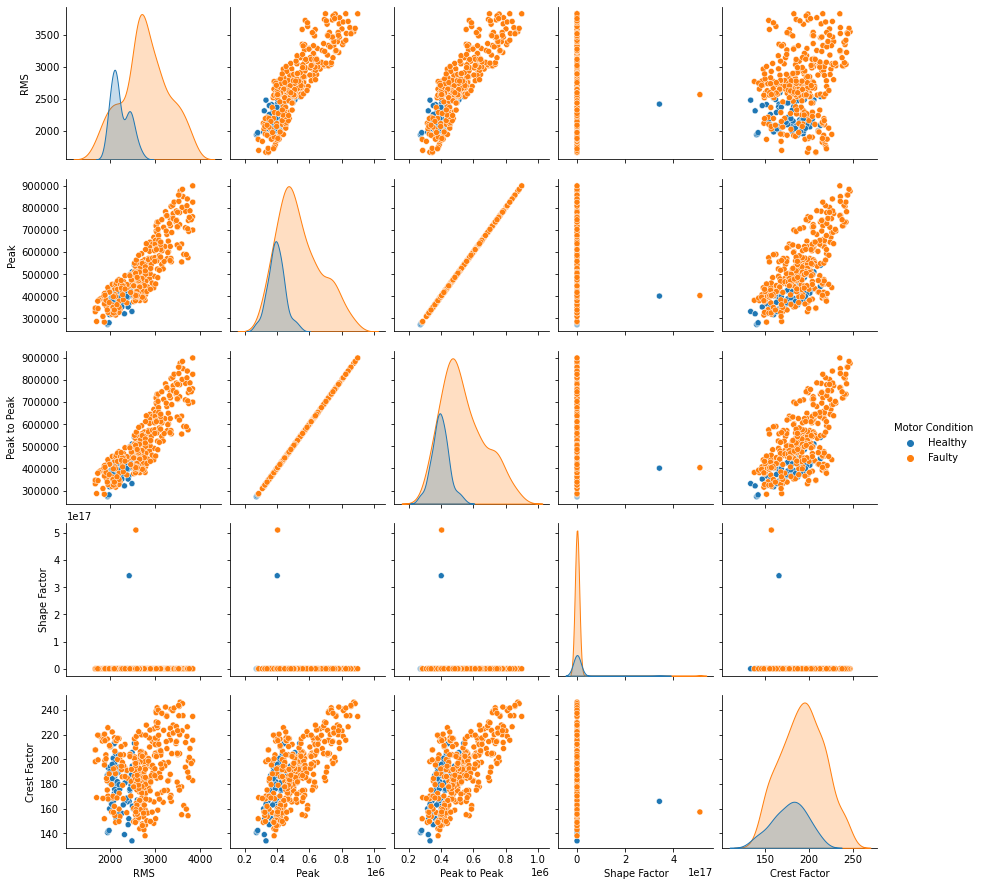

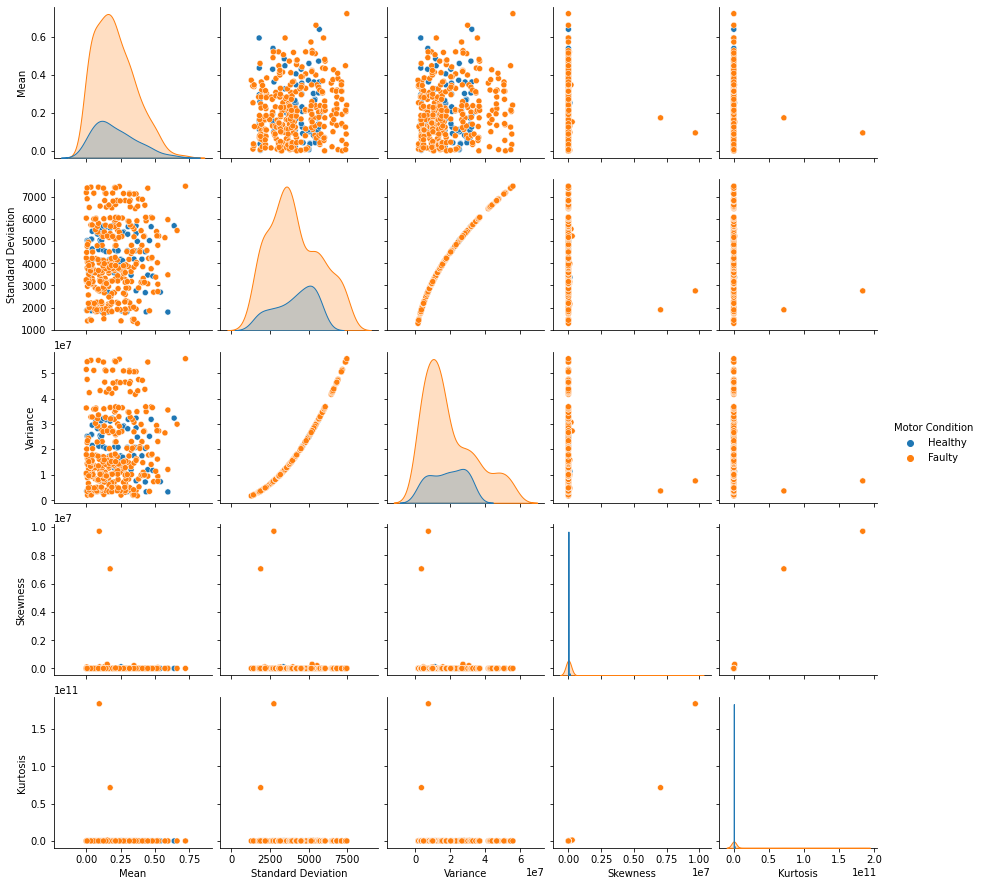

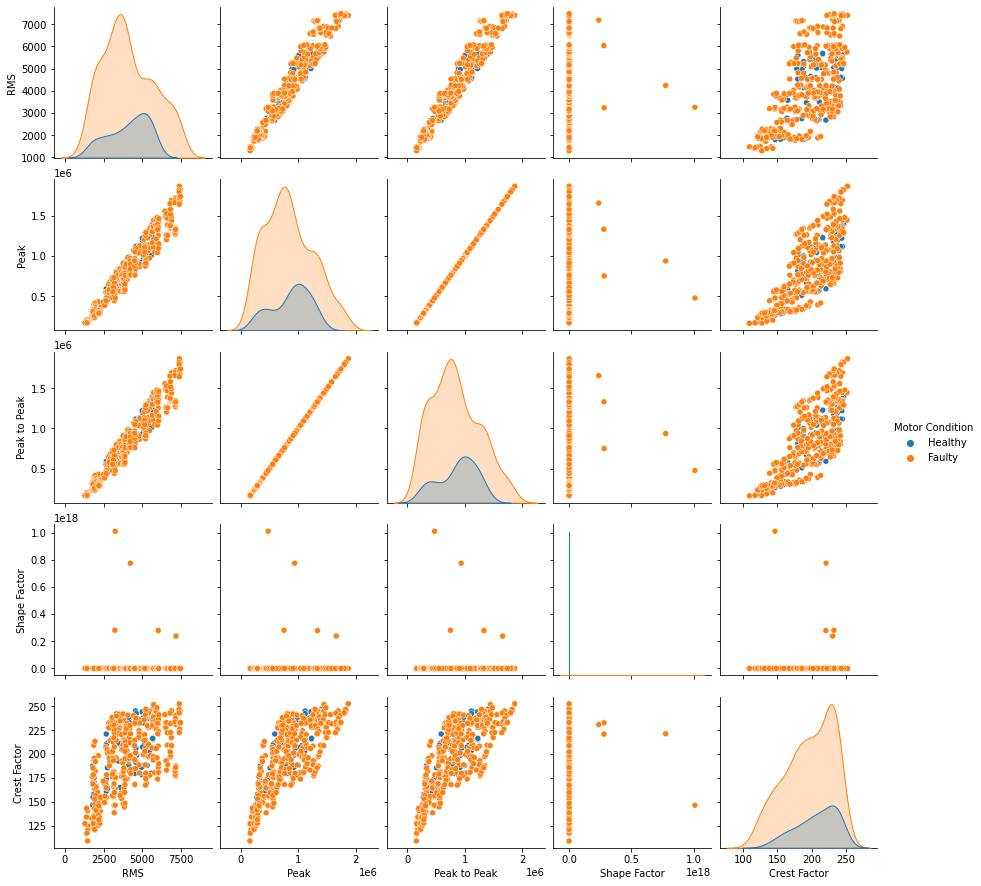

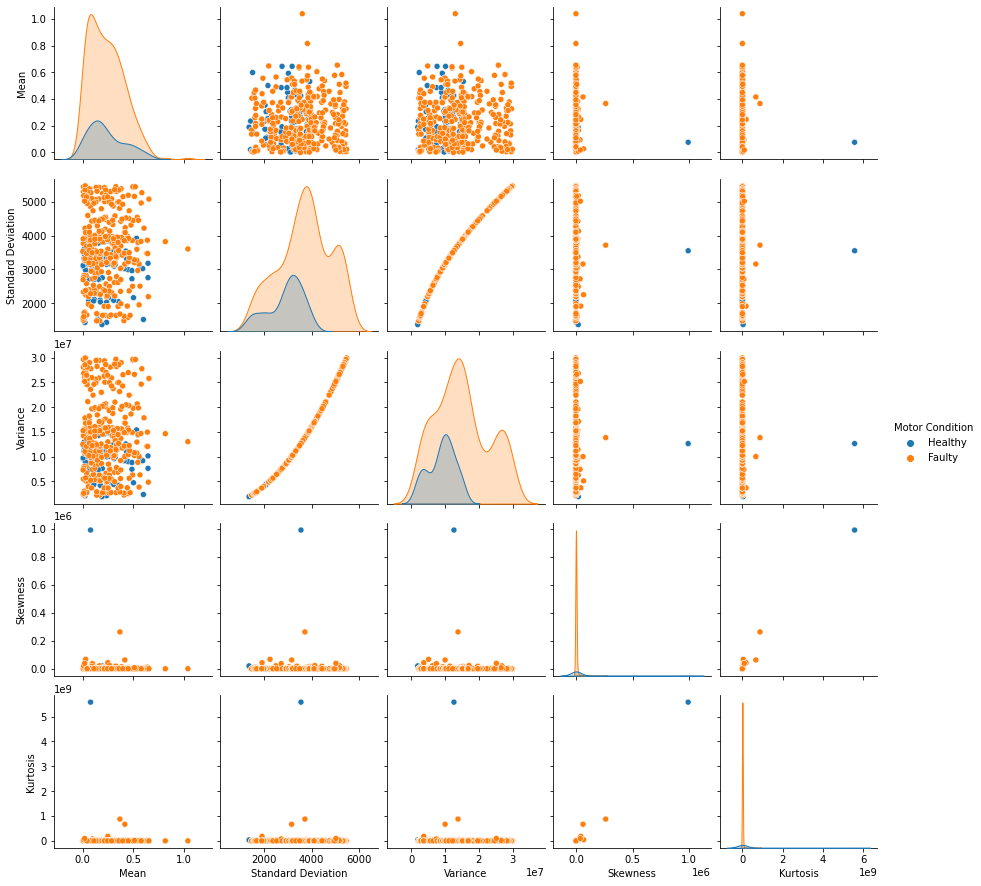

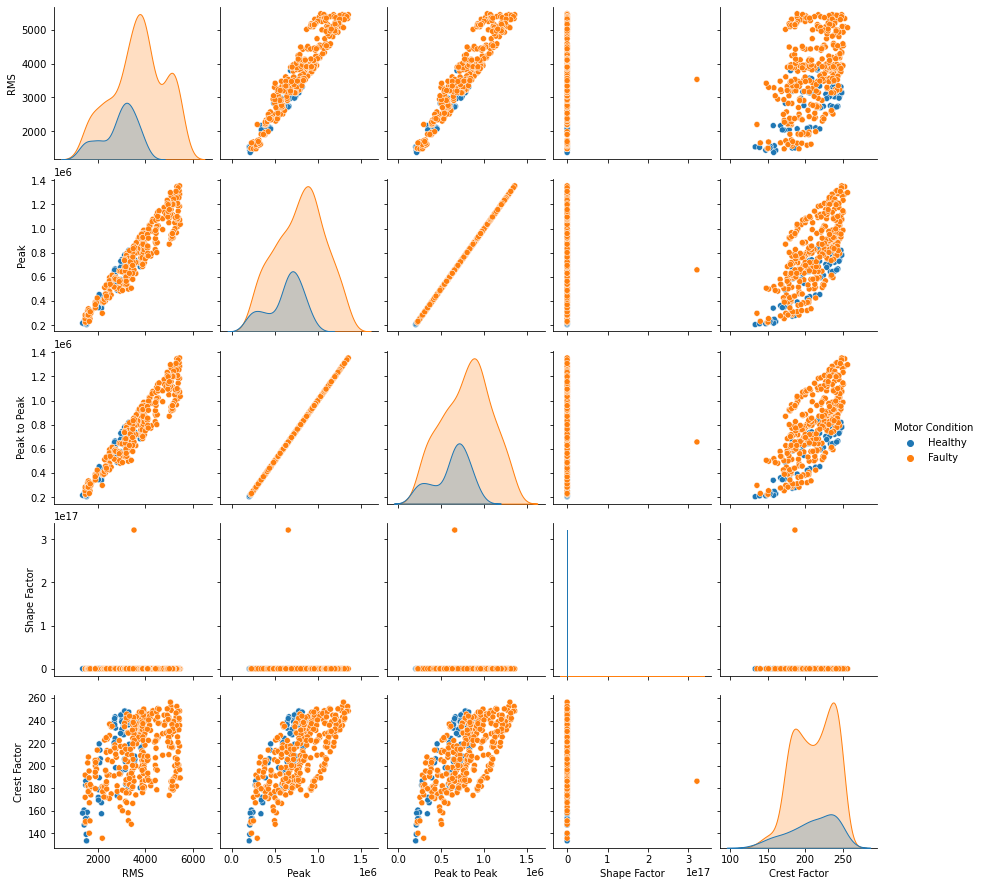

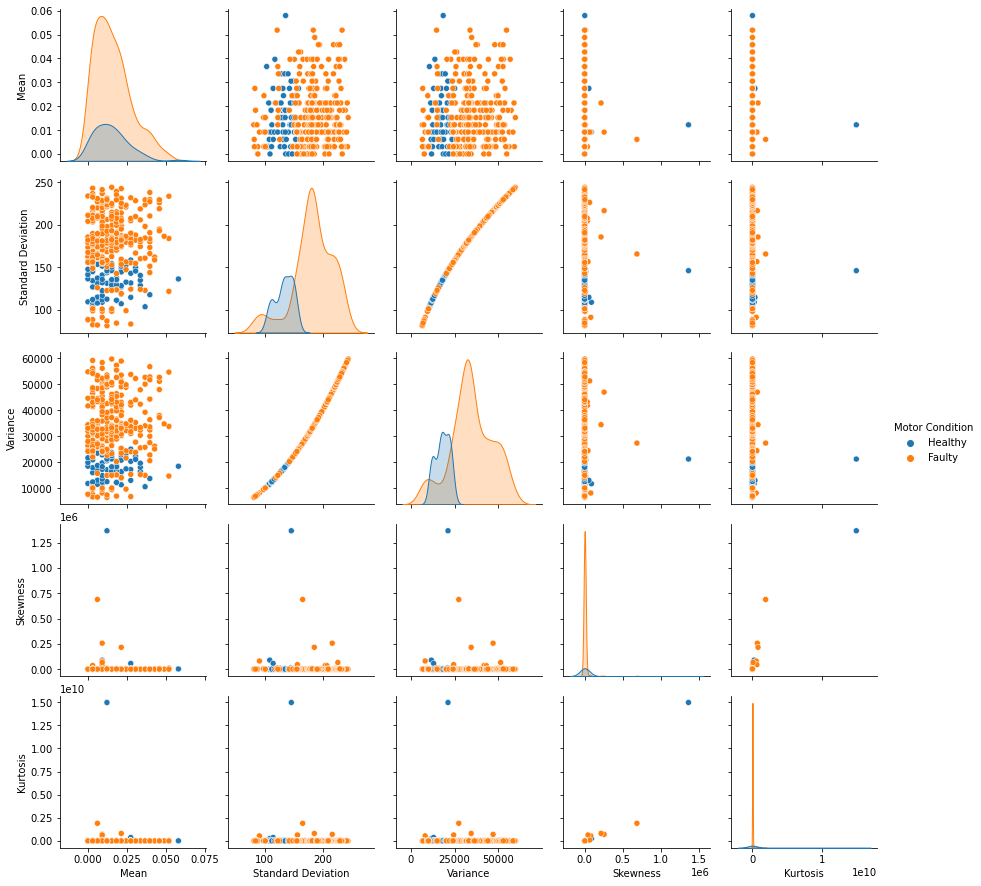

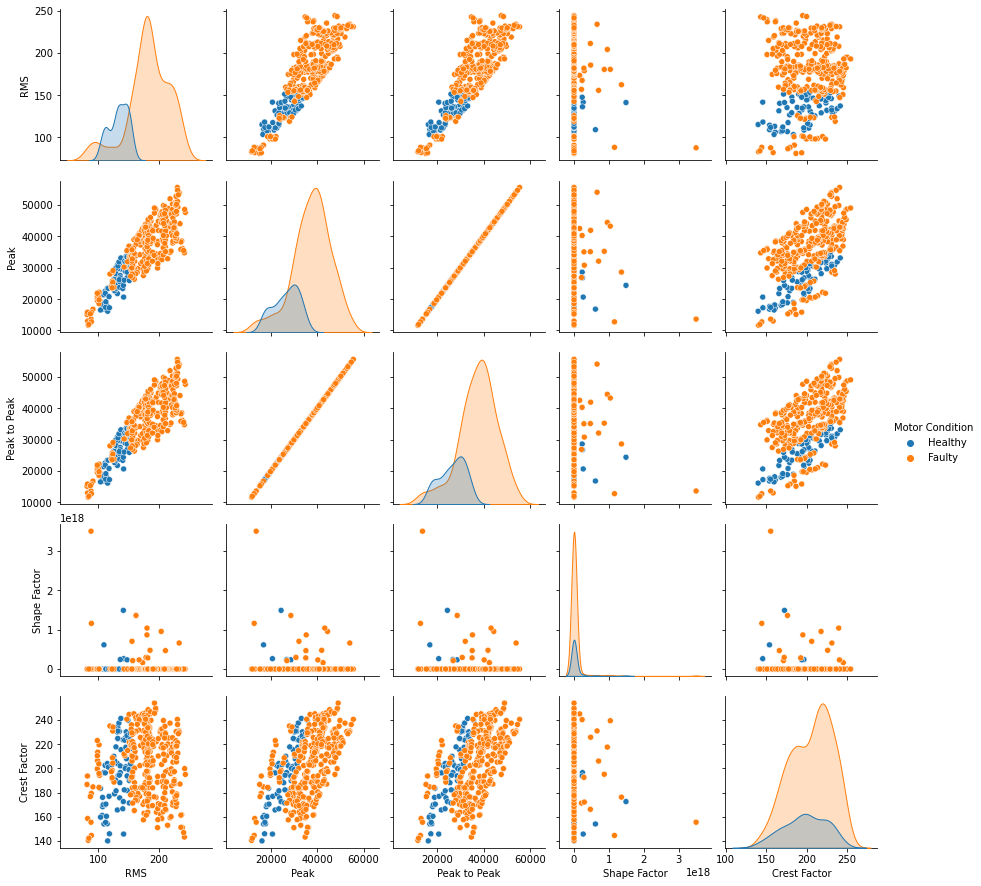

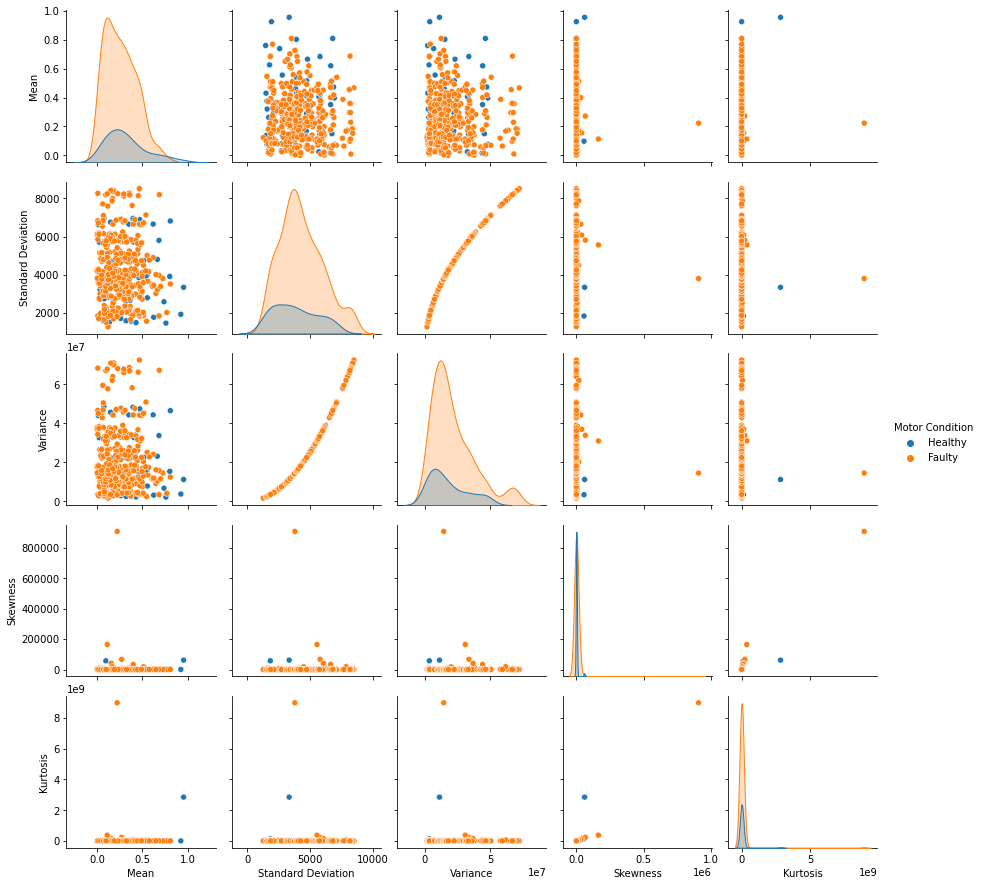

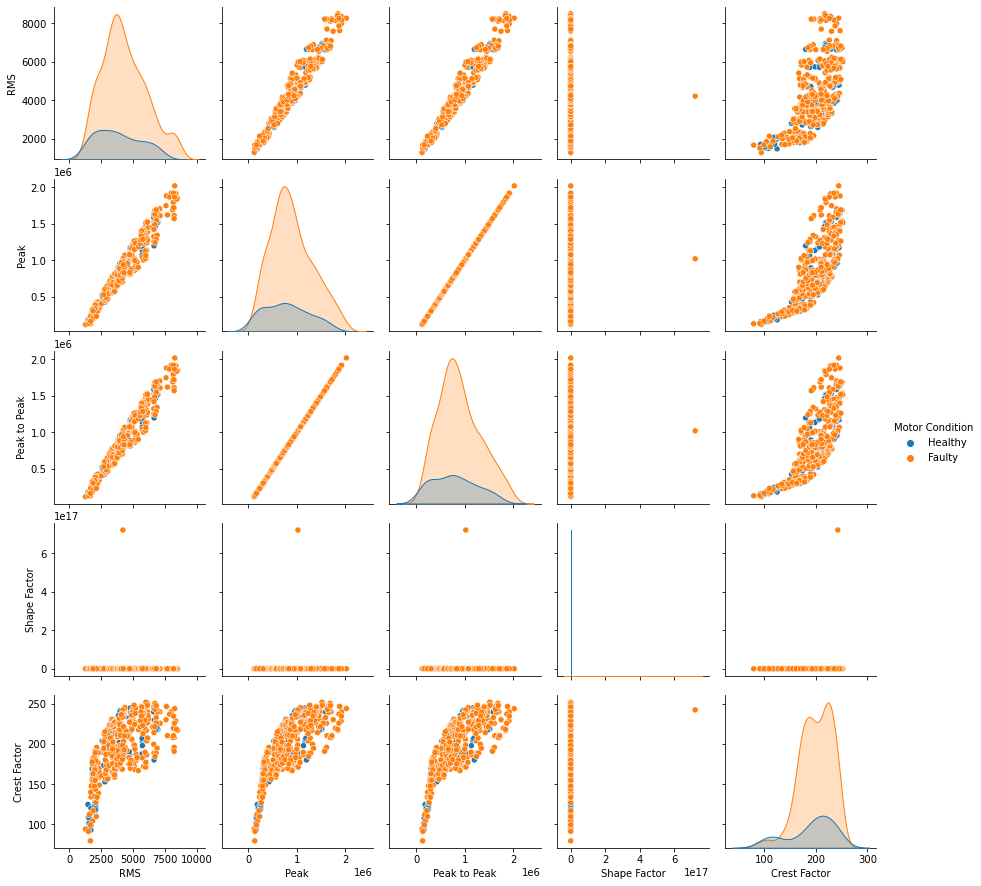

In [17]:
#Plotting frequency domain feature 
fqpairplot(FD_features_acpi,'FQ_Radial mechanical vibration on driven side')
fqpairplot(FD_features_carc,'FQ_Tangential mechanical vibration on driven side')
fqpairplot(FD_features_acpe,'FQ_Radial mechanical vibration on non-driven side')
fqpairplot(FD_features_axial,'FQ_Axial mechanical vibration on non-driven side')
fqpairplot(FD_features_base,'FQ_Tangential mechanical vibration on non-driven side')

In [18]:
def fqplotvstorque(df,title):
    plt.figure(figsize=(12,18))
    
    plt.subplot(3, 2, 1)
    sns.scatterplot(x="Mean", y= 'Torque', hue="Status", data=df);
    plt.title("Mean Vs Torque")

    plt.subplot(3, 2, 2)
    sns.scatterplot(x="Standard Deviation", y= 'Torque', hue="Status", data=df);
    plt.title("Standard Deviation Vs Torque")

    plt.subplot(3, 2, 3)
    sns.scatterplot(x="Variance", y= 'Torque', hue="Status", data=df);
    plt.title("Variance Vs Torque")

    plt.subplot(3, 2, 4)
    sns.scatterplot(x="Skewness", y= 'Torque', hue="Status", data=df);
    plt.title("Skewness Vs Torque")

    plt.subplot(3, 2, 5)
    sns.scatterplot(x="Kurtosis", y= 'Torque', hue="Status", data=df);
    plt.title("Kurtosis Vs Torque")

    plt.subplot(3, 2, 6)
    sns.scatterplot(x="RMS", y= 'Torque', hue="Status", data=df);
    plt.title("RMS Vs Torque")
    plt.savefig(title+" differnt loading_1.jpg")

    plt.figure(figsize=(12,12))
    plt.subplot(2, 2, 1)
    sns.scatterplot(x="Peak", y= 'Torque', hue="Status", data=df);
    plt.title("Peak Vs Torque")

    plt.subplot(2, 2, 2)
    sns.scatterplot(x="Peak to Peak", y= 'Torque', hue="Status", data=df);
    plt.title("Peak to Peak Vs Torque")

    plt.subplot(2, 2, 3)
    sns.scatterplot(x="Shape Factor", y= 'Torque', hue="Status", data=df);
    plt.title("Shape Factor Vs Torque")

    plt.subplot(2, 2, 4)
    sns.scatterplot(x="Crest Factor", y= 'Torque', hue="Status", data=df);
    plt.title("Crest Factor Vs Torque")
    plt.savefig(title+" differnt loading_2.jpg")

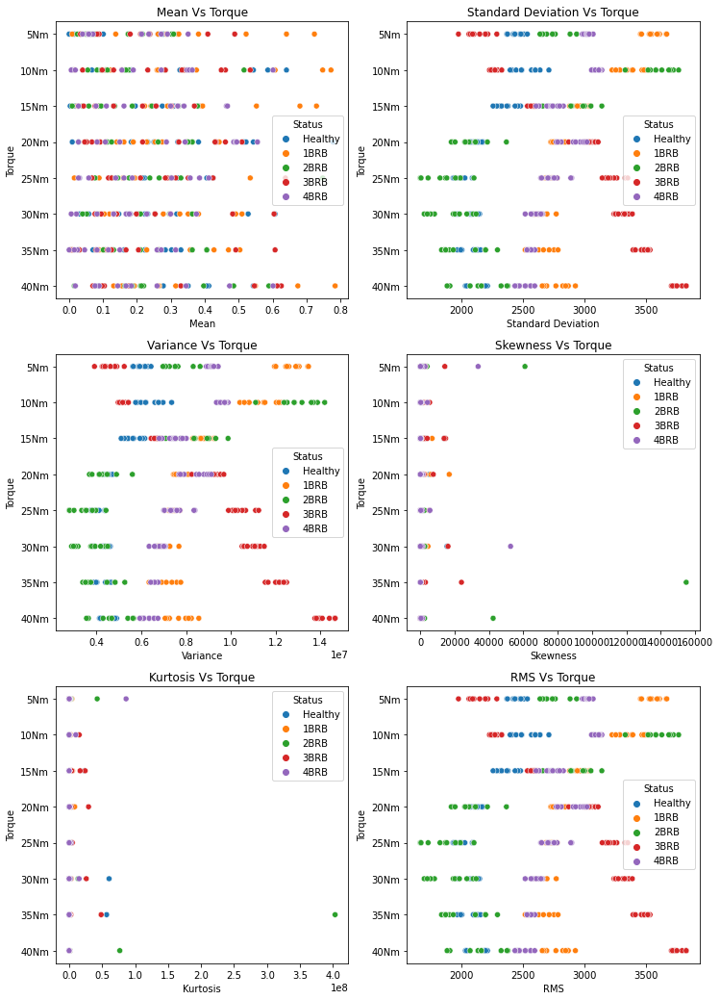

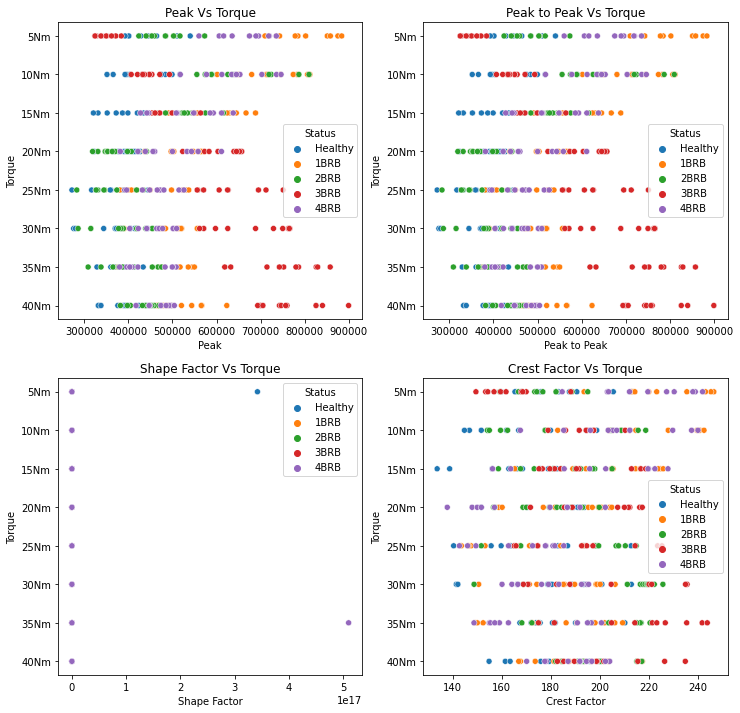

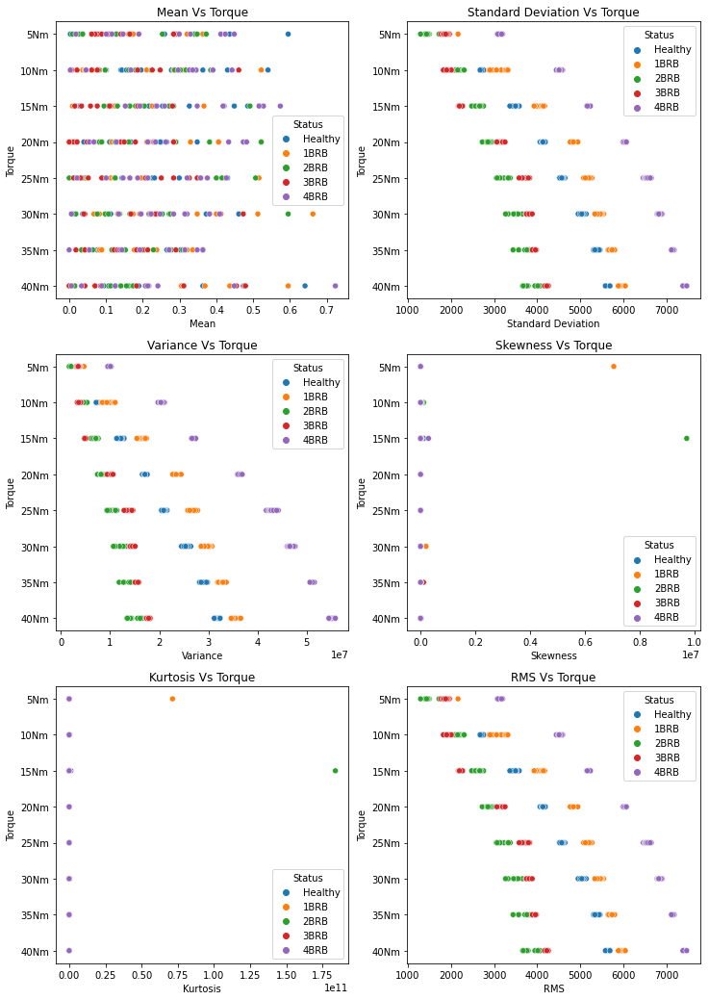

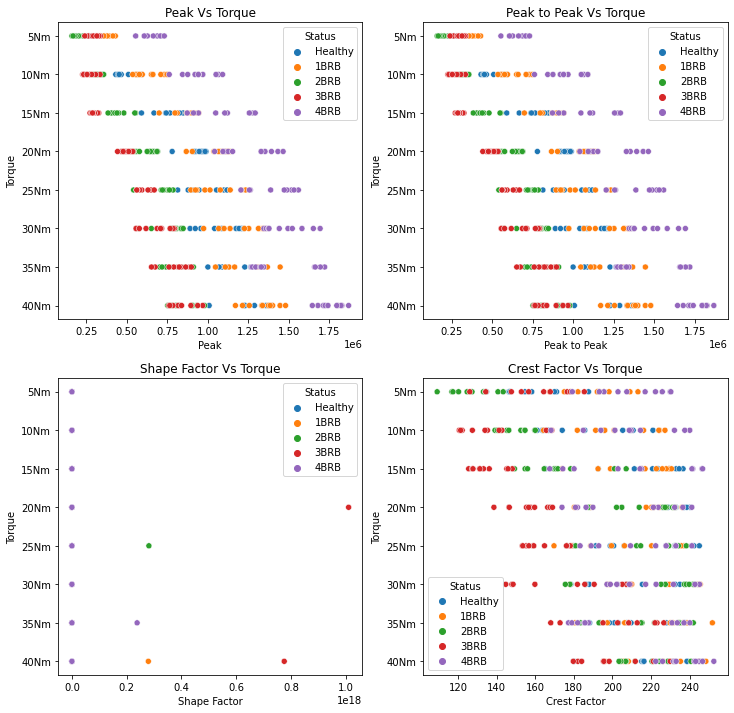

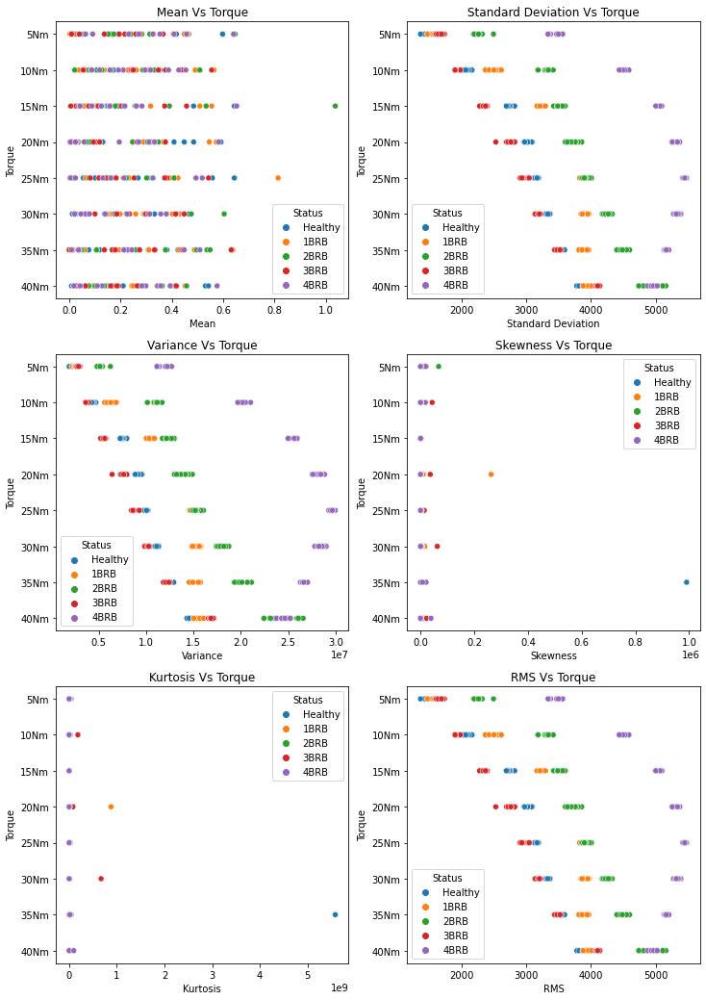

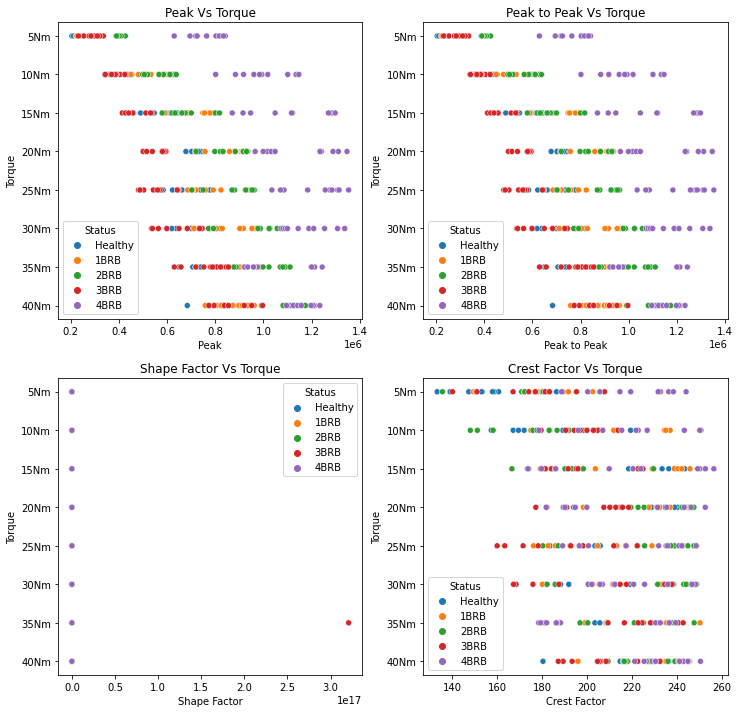

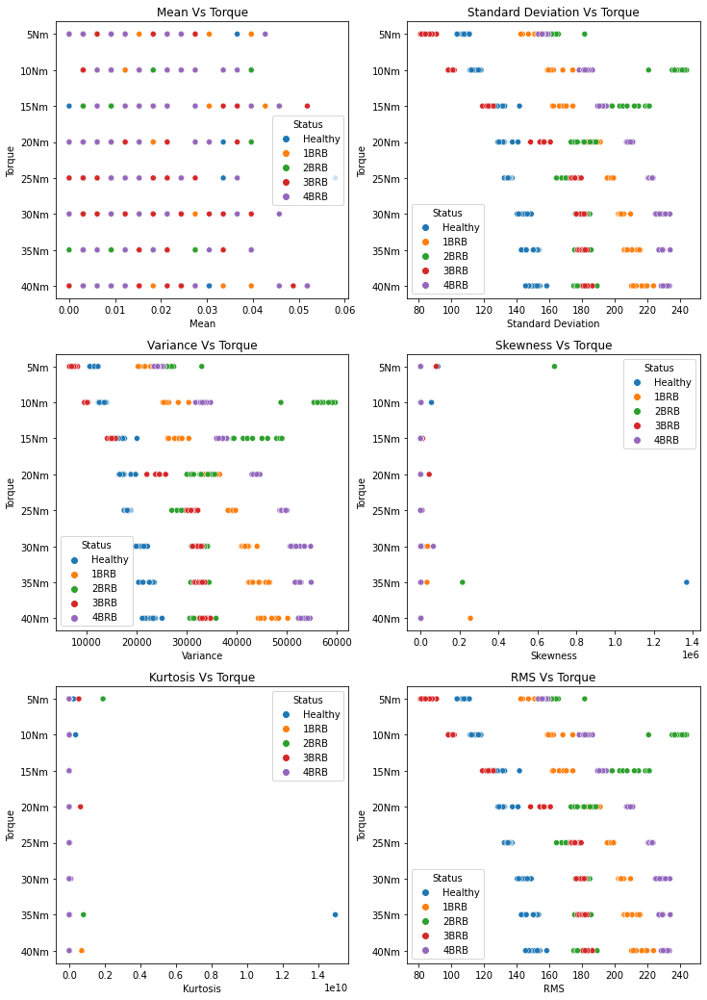

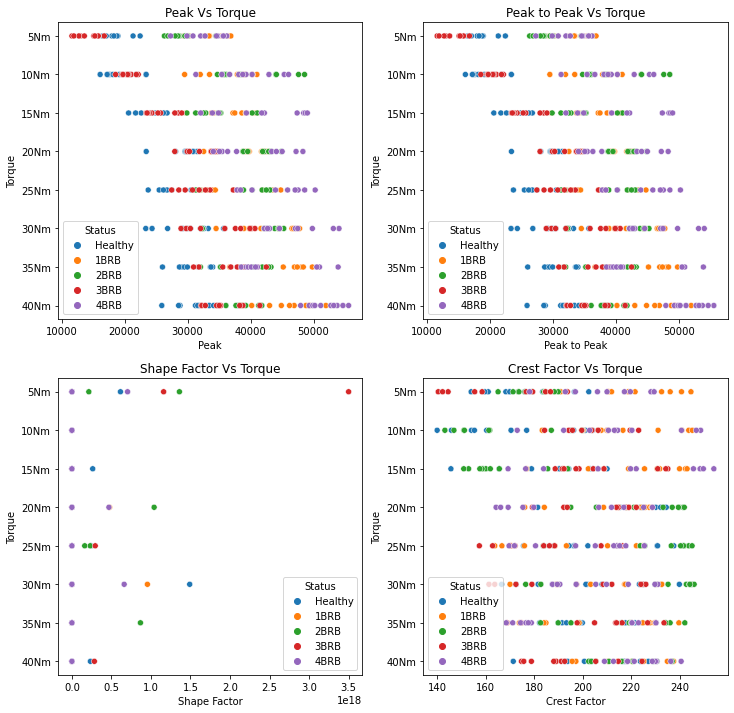

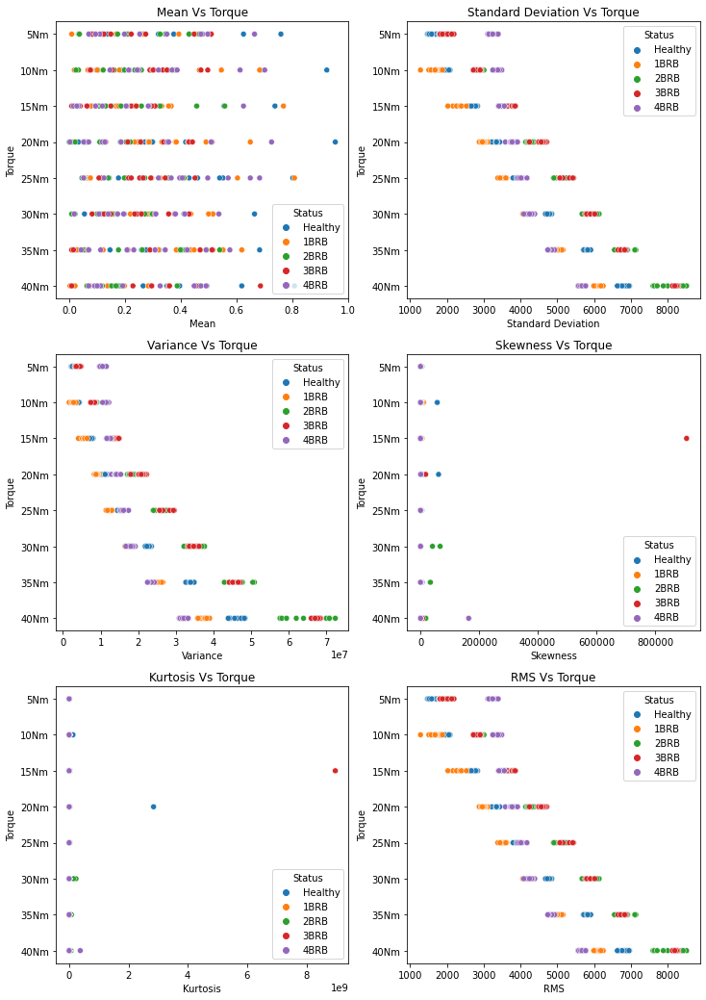

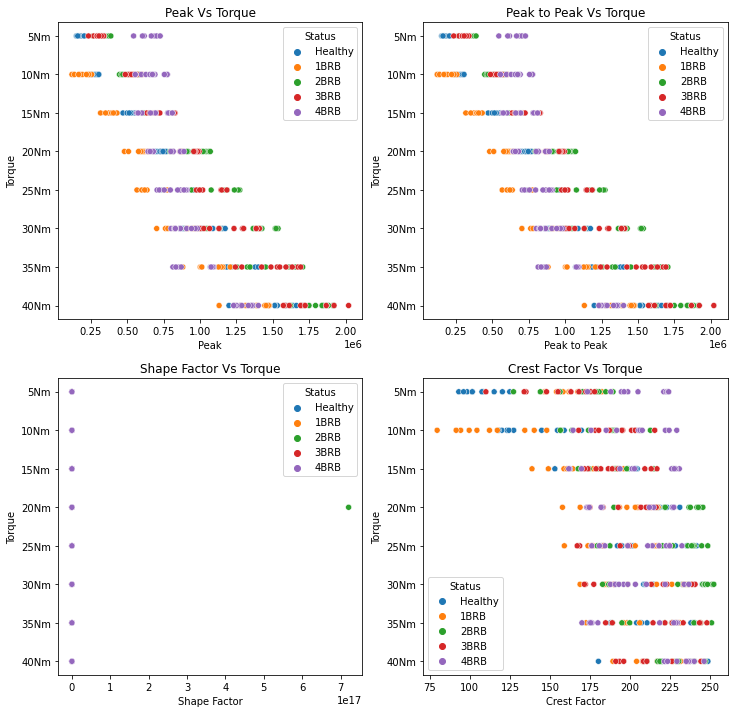

In [19]:
#Time doamin feature scatter plot against torque
fqplotvstorque(FD_features_acpi,'FQ_Radial mechanical vibration on driven side')
fqplotvstorque(FD_features_carc,'FQ_Tangential mechanical vibration on driven side')
fqplotvstorque(FD_features_acpe,'FQ_Radial mechanical vibration on non-driven side')
fqplotvstorque(FD_features_axial,'FQ_Axial mechanical vibration on non-driven side')
fqplotvstorque(FD_features_base,'FQ_Tangential mechanical vibration on non-driven side')

In [20]:
TD_features_acpe=TD_features_acpe.rename(columns={"Mean": "TD1", "Median": "TD2", "Standard Deviation": "TD3", "Variance": "TD4",
                                "Skewness": "TD5", "Kurtosis": "TD6","RMS": "TD7", "Peak": "TD8",
                                "Peak to Peak": "TD9", "Shape Factor": "TD10",
                                "Root-sum-of-square": "TD11", "Peak-magnitude-to-RMS ratio": "TD12"},errors="raise")
TD_features_acpi=TD_features_acpi.rename(columns={"Mean": "TD1", "Median": "TD2", "Standard Deviation": "TD3", "Variance": "TD4",
                                "Skewness": "TD5", "Kurtosis": "TD6","RMS": "TD7", "Peak": "TD8",
                                "Peak to Peak": "TD9", "Shape Factor": "TD10",
                                 "Root-sum-of-square": "TD11", "Peak-magnitude-to-RMS ratio": "TD12"},errors="raise")
TD_features_axial=TD_features_axial.rename(columns={"Mean": "TD1", "Median": "TD2", "Standard Deviation": "TD3", "Variance": "TD4",
                                "Skewness": "TD5", "Kurtosis": "TD6","RMS": "TD7", "Peak": "TD8",
                                "Peak to Peak": "TD9", "Shape Factor": "TD10",
                                 "Root-sum-of-square": "TD11", "Peak-magnitude-to-RMS ratio": "TD12"},errors="raise")
TD_features_base=TD_features_base.rename(columns={"Mean": "TD1", "Median": "TD2", "Standard Deviation": "TD3", "Variance": "TD4",
                                "Skewness": "TD5", "Kurtosis": "TD6","RMS": "TD7", "Peak": "TD8",
                                "Peak to Peak": "TD9", "Shape Factor": "TD10",
                                 "Root-sum-of-square": "TD11", "Peak-magnitude-to-RMS ratio": "TD12"},errors="raise")
TD_features_carc=TD_features_carc.rename(columns={"Mean": "TD1", "Median": "TD2", "Standard Deviation": "TD3", "Variance": "TD4",
                                "Skewness": "TD5", "Kurtosis": "TD6","RMS": "TD7", "Peak": "TD8",
                                "Peak to Peak": "TD9", "Shape Factor": "TD10",
                                 "Root-sum-of-square": "TD11", "Peak-magnitude-to-RMS ratio": "TD12"},errors="raise")

In [21]:
FD_features_acpe=FD_features_acpe.rename(columns={"Mean": "FD1", "Standard Deviation": "FD2", "Variance": "FD3",
                                "Skewness": "FD4", "Kurtosis": "FD5","RMS": "FD6", "Peak": "FD7",
                                "Peak to Peak": "FD8", "Shape Factor": "FD9", "Crest Factor": "FD10"})
FD_features_acpi=FD_features_acpi.rename(columns={"Mean": "FD1", "Standard Deviation": "FD2", "Variance": "FD3",
                                "Skewness": "FD4", "Kurtosis": "FD5","RMS": "FD6", "Peak": "FD7",
                                "Peak to Peak": "FD8", "Shape Factor": "FD9", "Crest Factor": "FD10"})
FD_features_axial=FD_features_axial.rename(columns={"Mean": "FD1", "Standard Deviation": "FD2", "Variance": "FD3",
                                "Skewness": "FD4", "Kurtosis": "FD5","RMS": "FD6", "Peak": "FD7",
                                "Peak to Peak": "FD8", "Shape Factor": "FD9", "Crest Factor": "FD10"})
FD_features_base=FD_features_base.rename(columns={"Mean": "FD1", "Standard Deviation": "FD2", "Variance": "FD3",
                                "Skewness": "FD4", "Kurtosis": "FD5","RMS": "FD6", "Peak": "FD7",
                                "Peak to Peak": "FD8", "Shape Factor": "FD9", "Crest Factor": "FD10"})
FD_features_carc=FD_features_carc.rename(columns={"Mean": "FD1", "Standard Deviation": "FD2", "Variance": "FD3",
                                "Skewness": "FD4", "Kurtosis": "FD5","RMS": "FD6", "Peak": "FD7",
                                "Peak to Peak": "FD8", "Shape Factor": "FD9", "Crest Factor": "FD10"})

In [22]:
TD_features_acpe.head()

,TD1,TD2,TD3,TD4,TD5,TD6,TD7,TD8,TD9,TD10,TD11,TD12,Torque,Status,Motor Condition
0,0.195833,0.277710,3.648883,13.314349,-0.085321,12.066211,3.654123,28.14636,56.06994,18.659418,1431.670141,7.702631,5Nm,Healthy,Healthy
1,0.195832,0.231934,3.660153,13.396718,-0.118907,10.359006,3.665376,33.12683,63.87939,18.716939,1436.079128,9.037772,5Nm,Healthy,Healthy
2,0.198418,0.265503,3.997891,15.983133,-0.108511,14.113159,4.002799,36.03516,71.25855,20.173600,1568.280017,9.002491,5Nm,Healthy,Healthy
3,0.197908,0.247192,3.490730,12.185196,-0.010963,8.236702,3.496324,28.09753,62.07580,17.666444,1369.845416,9.718283,5Nm,Healthy,Healthy
4,0.196435,0.241089,3.823409,14.618454,-0.129097,11.408154,3.828439,28.95813,61.11145,19.489583,1499.966573,8.398546,5Nm,Healthy,Healthy


In [23]:
def mergetdfd(df1,df2):
    df1.drop(['Torque'], axis =1, inplace = True)
    df1.drop(['Status'], axis =1, inplace = True)
    df1.drop(['Motor Condition'], axis =1, inplace = True)
    df2.drop(['Torque'], axis =1, inplace = True)
    df2['Motor Condition'] = np.where(df2['Motor Condition'] == 'Healthy', 0, 1)
    df_new = pd.concat([df1,df2], axis=1)
    return(df_new)

In [24]:
acpi=mergetdfd(TD_features_acpi,FD_features_acpi)
carc=mergetdfd(TD_features_carc,FD_features_carc)
acpe=mergetdfd(TD_features_acpe,FD_features_acpe)
axial=mergetdfd(TD_features_axial,FD_features_axial)
base=mergetdfd(TD_features_base,FD_features_base)

In [25]:
acpi.head()

,TD1,TD2,TD3,TD4,TD5,TD6,TD7,TD8,TD9,TD10,...,FD3,FD4,FD5,FD6,FD7,FD8,FD9,FD10,Status,Motor Condition
0,0.189753,1.029968,6.314120,39.868113,-0.440648,5.257396,6.316950,51.17493,104.71497,33.290335,...,6125442.003,1079.566056,7.691990e+05,2474.954970,464268.9178,464268.9374,35260.575700,187.586814,Healthy,0
1,0.187005,0.442505,6.404970,41.023639,-0.286931,6.263677,6.407678,55.02930,105.63050,34.264787,...,6302660.795,154.207800,5.740535e+05,2510.501890,401160.1121,401160.1574,74785.559970,159.792794,Healthy,0
2,0.188468,0.384522,6.045430,36.547223,-0.204818,3.327036,6.048347,40.01160,74.55750,32.092105,...,5615597.513,1310.603413,1.813860e+06,2369.717479,451749.8955,451749.9063,155301.795200,190.634495,Healthy,0
3,0.186906,0.503540,6.210441,38.569572,-0.283780,4.023746,6.213232,39.02588,87.41150,33.242527,...,5925946.031,285.019716,8.129581e+04,2434.318679,425148.6255,425148.6853,34681.632230,174.647892,Healthy,0
4,0.189902,0.390625,6.339947,40.194924,-0.350165,6.884948,6.342769,54.40063,122.89733,33.400188,...,6175617.323,171.860917,3.588301e+04,2485.070858,510646.4684,510646.4939,8948.438508,205.485677,Healthy,0


In [26]:
# import sklearn librarys
import sklearn
from sklearn.model_selection import train_test_split #tp create train and test data

#import the class MinMaxScaler for rescaling
from sklearn.preprocessing import MinMaxScaler
#import RFE auto selection of variables
from sklearn.feature_selection import RFE

from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import f_classif

from sklearn.svm import SVC
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve,roc_auc_score, precision_recall_curve, average_precision_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import RandomOverSampler
from imblearn import over_sampling
from sklearn.neural_network import MLPClassifier
import itertools

## Feature Selection using Mutual Information & F-test

In [27]:
def miplot(X,y,Title,Name):
    mi_score = mutual_info_classif(X,y)
    df_mi_score = pd.Series(mi_score, X.columns[0:len(X.columns)])
    plt.subplot(1, 1, 1)
    df_mi_score.plot(kind='barh', color ='teal')
    plt.title(Title)
    plt.savefig(Name+".jpg")
    plt.show()
    return(df_mi_score)

In [28]:
def ftestplot(X,y,Title,Name):
    f_score = f_classif(X,y)
    f_score_list = list(f_score)
    df_f_score1 = pd.Series(f_score_list[0], X.columns[0:len(X.columns)])
    plt.figure(figsize=(6,6))
    plt.subplot(1, 1, 1)
    df_f_score1.plot(kind='barh', color ='teal')
    plt.title(Title+" F-score plot")
    plt.savefig(Name+"_1.jpg")
    plt.show()
    df_f_score2 = pd.Series(f_score_list[1], X.columns[0:len(X.columns)])
    plt.figure(figsize=(6,6))
    plt.subplot(1, 1, 1)
    df_f_score2.plot(kind='barh', color ='teal')
    plt.title(Title+" P-vaue plot")
    plt.savefig(Name+"_2.jpg")
    plt.show()

In [29]:
#acpi
df_acpi=acpi.drop("Status", axis=1)
cols = df_acpi.columns
## rescaling the train data MinMaxScaler
scaler = MinMaxScaler()
df_acpi[cols] = scaler.fit_transform(df_acpi[cols])
y = df_acpi.pop("Motor Condition")
X = df_acpi

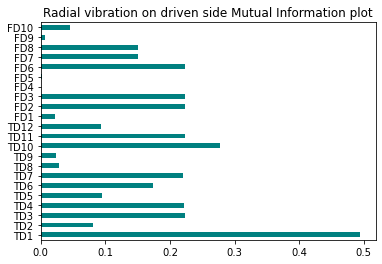

In [30]:
mi_score_acpi = miplot(X,y,"Radial vibration on driven side Mutual Information plot","MI_acpi")

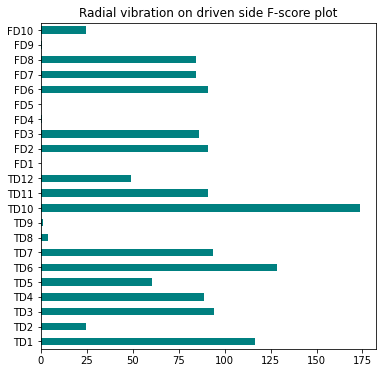

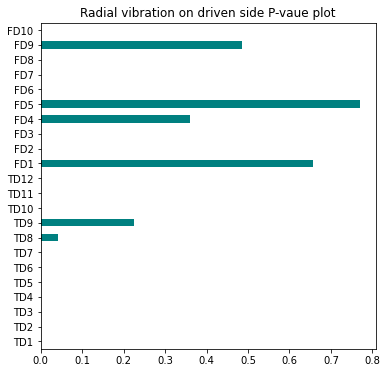

In [31]:
ftestplot(X,y,"Radial vibration on driven side","F_acpi")

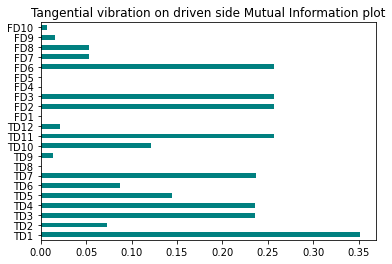

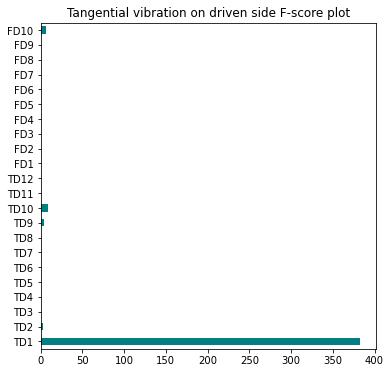

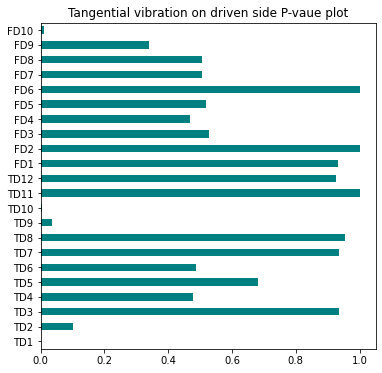

In [32]:
#carc
df_carc=carc.drop("Status", axis=1)
cols = df_carc.columns
## rescaling the train data MinMaxScaler
scaler = MinMaxScaler()
df_carc[cols] = scaler.fit_transform(df_carc[cols])
y = df_carc.pop("Motor Condition")
X = df_carc
mi_score_carc = miplot(X,y,"Tangential vibration on driven side Mutual Information plot","MI_carc")
ftestplot(X,y,"Tangential vibration on driven side","F_carc")

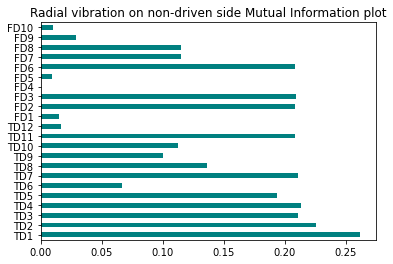

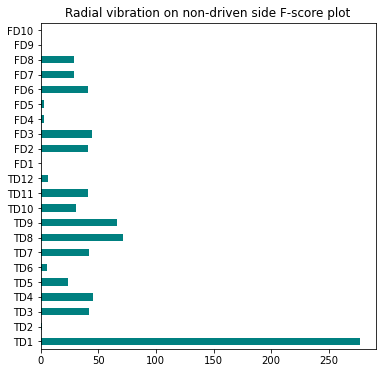

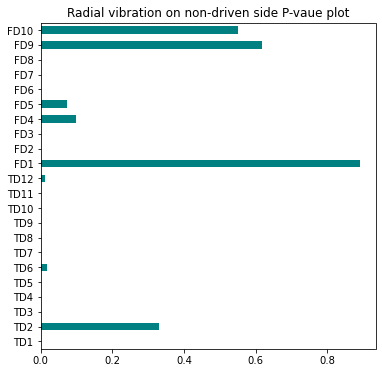

In [33]:
#acpe
df_acpe=acpe.drop("Status", axis=1)
cols = df_acpe.columns
## rescaling the train data MinMaxScaler
scaler = MinMaxScaler()
df_acpe[cols] = scaler.fit_transform(df_acpe[cols])
y = df_acpe.pop("Motor Condition")
X = df_acpe
mi_score_acpe = miplot(X,y,"Radial vibration on non-driven side Mutual Information plot","MI_acpe")
ftestplot(X,y,"Radial vibration on non-driven side","F_acpe")

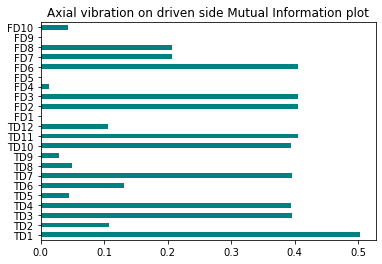

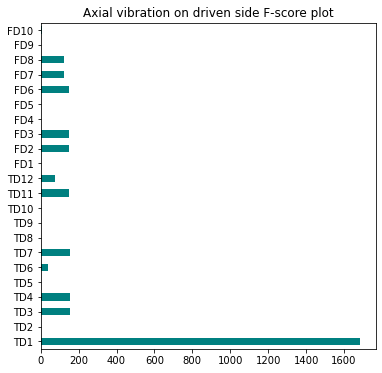

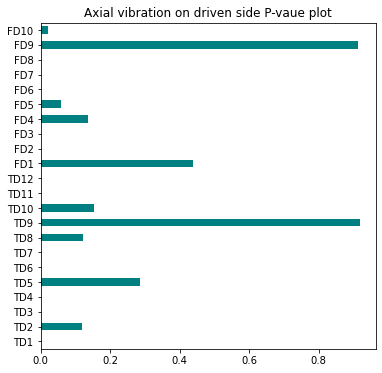

In [34]:
#axial
df_axial=axial.drop("Status", axis=1)
cols = df_axial.columns
## rescaling the train data MinMaxScaler
scaler = MinMaxScaler()
df_axial[cols] = scaler.fit_transform(df_axial[cols])
y = df_axial.pop("Motor Condition")
X = df_axial
mi_score_axial = miplot(X,y,"Axial vibration on driven side Mutual Information plot","MI_axial")
ftestplot(X,y,"Axial vibration on driven side","F_axial")

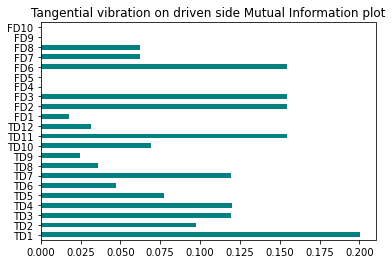

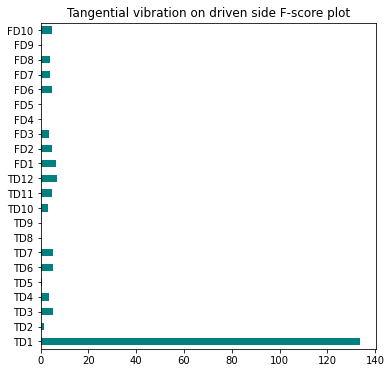

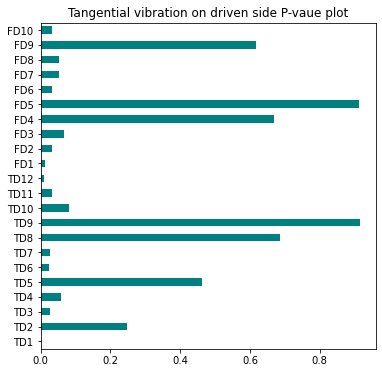

In [35]:
#base
df_base=base.drop("Status", axis=1)
cols = df_base.columns
## rescaling the train data MinMaxScaler
scaler = MinMaxScaler()
df_base[cols] = scaler.fit_transform(df_base[cols])
y = df_base.pop("Motor Condition")
X = df_base
mi_score_base = miplot(X,y,"Tangential vibration on driven side Mutual Information plot","MI_base")
ftestplot(X,y,"Tangential vibration on driven side","F_base")

In [36]:
acpi.drop(['TD2','TD5','TD6','TD8','TD9','TD12'], axis = 1, inplace= True)
acpi.drop(['FD1','FD4','FD5','FD8','FD9','FD10'], axis = 1, inplace= True)
acpi.drop(['Status'], axis = 1, inplace= True)

In [37]:
acpi.head()

,TD1,TD3,TD4,TD7,TD10,TD11,FD2,FD3,FD6,FD7,Motor Condition
0,0.189753,6.314120,39.868113,6.316950,33.290335,2474.954970,2474.963031,6125442.003,2474.954970,464268.9178,0
1,0.187005,6.404970,41.023639,6.407678,34.264787,2510.501890,2510.510067,6302660.795,2510.501890,401160.1121,0
2,0.188468,6.045430,36.547223,6.048347,32.092105,2369.717479,2369.725198,5615597.513,2369.717479,451749.8955,0
3,0.186906,6.210441,38.569572,6.213232,33.242527,2434.318679,2434.326607,5925946.031,2434.318679,425148.6255,0
4,0.189902,6.339947,40.194924,6.342769,33.400188,2485.070858,2485.078937,6175617.323,2485.070858,510646.4684,0


In [38]:
carc.drop(['TD2','TD5','TD6','TD8','TD9','TD12'], axis = 1, inplace= True)
carc.drop(['FD1','FD4','FD5','FD8','FD9','FD10'], axis = 1, inplace= True)
carc.drop(['Status'], axis = 1, inplace= True)

In [39]:
acpe.drop(['TD2','TD5','TD6','TD8','TD9','TD12'], axis = 1, inplace= True)
acpe.drop(['FD1','FD4','FD5','FD8','FD9','FD10'], axis = 1, inplace= True)
acpe.drop(['Status'], axis = 1, inplace= True)

In [40]:
axial.drop(['TD2','TD5','TD6','TD8','TD9','TD12'], axis = 1, inplace= True)
axial.drop(['FD1','FD4','FD5','FD8','FD9','FD10'], axis = 1, inplace= True)
axial.drop(['Status'], axis = 1, inplace= True)

In [41]:
base.drop(['TD2','TD5','TD6','TD8','TD9','TD12'], axis = 1, inplace= True)
base.drop(['FD1','FD4','FD5','FD8','FD9','FD10'], axis = 1, inplace= True)
base.drop(['Status'], axis = 1, inplace= True)

In [42]:
base.head()

,TD1,TD3,TD4,TD7,TD10,TD11,FD2,FD3,FD6,FD7,Motor Condition
0,0.214442,4.380185,19.186018,4.385417,20.450380,1718.188059,1718.193636,2952189.369,1718.188059,168841.3634,0
1,0.213505,4.357954,18.991765,4.363167,20.435855,1709.470778,1709.476344,2922309.371,1709.470778,159033.2578,0
2,0.215906,3.758764,14.128310,3.764948,17.437940,1475.091023,1475.095632,2175907.123,1475.091023,184135.2986,0
3,0.215171,3.829603,14.665860,3.835631,17.825949,1502.784241,1502.789074,2258375.001,1502.784241,162993.5509,0
4,0.214041,4.358941,19.000369,4.364179,20.389406,1709.867308,1709.872877,2923665.257,1709.867308,205624.6913,0


## Model Building

In [43]:
def svmbasicmodel(X_train,y_train):
    
    model_svc = SVC(kernel='linear')
    model_svc.fit(X_train, y_train)    
    y_pred = model_svc.predict(X_train)
    
    Accuracy = metrics.accuracy_score(y_pred=y_pred, y_true=y_train)
    print("Train Accuarcy model  : {0}".format(Accuracy))
    print("Confusion Matrix")
    print(confusion_matrix(y_train, y_pred))
    print("train classification Report")
    print(classification_report(y_train, y_pred))

In [44]:
def annbasicmodel(X_train,y_train):
    
    model_ann = MLPClassifier(random_state=1, max_iter=300)
    model_ann.fit(X_train, y_train)    
    y_pred = model_ann.predict(X_train)
    
    Accuracy = metrics.accuracy_score(y_pred=y_pred, y_true=y_train)
    print("Train Accuarcy model  : {0}".format(Accuracy))
    print("Confusion Matrix")
    print(confusion_matrix(y_train, y_pred))
    print("train classification Report")
    print(classification_report(y_train, y_pred))

In [45]:
selected_col = acpi.columns

In [46]:
df_train_acpi, df_test_acpi = train_test_split(acpi,train_size=0.7,random_state=100)
scaler_acpi = MinMaxScaler()
df_train_acpi[selected_col] = scaler_acpi.fit_transform(df_train_acpi[selected_col])
y_train_acpi = df_train_acpi.pop("Motor Condition")
X_train_acpi = df_train_acpi

In [47]:
svmbasicmodel(X_train_acpi,y_train_acpi)

Train Accuarcy model  : 0.946236559139785
Confusion Matrix
[[ 43  12]
 [  3 221]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.93      0.78      0.85        55
         1.0       0.95      0.99      0.97       224

    accuracy                           0.95       279
   macro avg       0.94      0.88      0.91       279
weighted avg       0.95      0.95      0.94       279



In [48]:
annbasicmodel(X_train_acpi,y_train_acpi)

Train Accuarcy model  : 0.9605734767025089
Confusion Matrix
[[ 47   8]
 [  3 221]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.94      0.85      0.90        55
         1.0       0.97      0.99      0.98       224

    accuracy                           0.96       279
   macro avg       0.95      0.92      0.94       279
weighted avg       0.96      0.96      0.96       279



In [49]:
df_train_carc, df_test_carc = train_test_split(carc,train_size=0.7,random_state=100)
scaler_carc = MinMaxScaler()
df_train_carc[selected_col] = scaler_carc.fit_transform(df_train_carc[selected_col])
y_train_carc = df_train_carc.pop("Motor Condition")
X_train_carc = df_train_carc

In [50]:
svmbasicmodel(X_train_carc,y_train_carc)

Train Accuarcy model  : 0.9175627240143369
Confusion Matrix
[[ 42  13]
 [ 10 214]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.81      0.76      0.79        55
         1.0       0.94      0.96      0.95       224

    accuracy                           0.92       279
   macro avg       0.88      0.86      0.87       279
weighted avg       0.92      0.92      0.92       279



In [51]:
annbasicmodel(X_train_carc,y_train_carc)

Train Accuarcy model  : 0.9139784946236559
Confusion Matrix
[[ 42  13]
 [ 11 213]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.79      0.76      0.78        55
         1.0       0.94      0.95      0.95       224

    accuracy                           0.91       279
   macro avg       0.87      0.86      0.86       279
weighted avg       0.91      0.91      0.91       279



In [52]:
df_train_acpe, df_test_acpe = train_test_split(acpe,train_size=0.7,random_state=100)
scaler_acpe = MinMaxScaler()
df_train_acpe[selected_col] = scaler_acpe.fit_transform(df_train_acpe[selected_col])
y_train_acpe = df_train_acpe.pop("Motor Condition")
X_train_acpe = df_train_acpe

In [53]:
svmbasicmodel(X_train_acpe,y_train_acpe)

Train Accuarcy model  : 0.942652329749104
Confusion Matrix
[[ 39  16]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      0.71      0.83        55
         1.0       0.93      1.00      0.97       224

    accuracy                           0.94       279
   macro avg       0.97      0.85      0.90       279
weighted avg       0.95      0.94      0.94       279



In [54]:
annbasicmodel(X_train_acpe,y_train_acpe)

Train Accuarcy model  : 0.96415770609319
Confusion Matrix
[[ 45  10]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90        55
         1.0       0.96      1.00      0.98       224

    accuracy                           0.96       279
   macro avg       0.98      0.91      0.94       279
weighted avg       0.97      0.96      0.96       279



In [55]:
df_train_axial, df_test_axial = train_test_split(axial,train_size=0.7,random_state=100)
scaler_axial = MinMaxScaler()
df_train_axial[selected_col] = scaler_axial.fit_transform(df_train_axial[selected_col])
y_train_axial = df_train_axial.pop("Motor Condition")
X_train_axial = df_train_axial

In [56]:
svmbasicmodel(X_train_axial,y_train_axial)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



In [57]:
annbasicmodel(X_train_axial,y_train_axial)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



In [58]:
df_train_base, df_test_base = train_test_split(base,train_size=0.7,random_state=100)
scaler_base = MinMaxScaler()
df_train_base[selected_col] = scaler_base.fit_transform(df_train_base[selected_col])
y_train_base = df_train_base.pop("Motor Condition")
X_train_base = df_train_base

In [59]:
svmbasicmodel(X_train_base,y_train_base)

Train Accuarcy model  : 0.8351254480286738
Confusion Matrix
[[ 10  45]
 [  1 223]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.18      0.30        55
         1.0       0.83      1.00      0.91       224

    accuracy                           0.84       279
   macro avg       0.87      0.59      0.60       279
weighted avg       0.85      0.84      0.79       279



In [60]:
annbasicmodel(X_train_base,y_train_base)

Train Accuarcy model  : 0.8422939068100358
Confusion Matrix
[[ 20  35]
 [  9 215]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.69      0.36      0.48        55
         1.0       0.86      0.96      0.91       224

    accuracy                           0.84       279
   macro avg       0.77      0.66      0.69       279
weighted avg       0.83      0.84      0.82       279



In [61]:
driven = acpi.drop(['Motor Condition'], axis =1, inplace = False)
driven = pd.concat([driven,carc], axis=1)

In [62]:
driven.head()

,TD1,TD3,TD4,TD7,TD10,TD11,FD2,FD3,FD6,FD7,...,TD3,TD4,TD7,TD10,TD11,FD2,FD3,FD6,FD7,Motor Condition
0,0.189753,6.314120,39.868113,6.316950,33.290335,2474.954970,2474.963031,6125442.003,2474.954970,464268.9178,...,4.807050,23.107732,4.807770,57.176627,1883.664405,1883.670541,3548214.706,1883.664405,322264.2943,0
1,0.187005,6.404970,41.023639,6.407678,34.264787,2510.501890,2510.510067,6302660.795,2510.501890,401160.1121,...,4.637606,21.507391,4.638320,56.400074,1817.274660,1817.280574,3302508.685,1817.274660,265949.1689,0
2,0.188468,6.045430,36.547223,6.048347,32.092105,2369.717479,2369.725198,5615597.513,2369.717479,451749.8955,...,4.618377,21.329408,4.619124,55.071890,1809.753590,1809.759432,3275229.203,1809.753590,307645.1292,0
3,0.186906,6.210441,38.569572,6.213232,33.242527,2434.318679,2434.326607,5925946.031,2434.318679,425148.6255,...,4.620121,21.345514,4.620848,55.787769,1810.429127,1810.435000,3277674.888,1810.429127,266091.7984,0
4,0.189902,6.339947,40.194924,6.342769,33.400188,2485.070858,2485.078937,6175617.323,2485.070858,510646.4684,...,4.596857,21.131090,4.597609,54.717192,1801.324359,1801.330128,3244790.231,1801.324359,338008.4792,0


In [63]:
df_train_driven, df_test_driven = train_test_split(driven,train_size=0.7,random_state=100)
scaler_driven = MinMaxScaler()
df_train_driven[selected_col] = scaler_driven.fit_transform(df_train_driven[selected_col])
y_train_driven = df_train_driven.pop("Motor Condition")
X_train_driven = df_train_driven

In [64]:
svmbasicmodel(X_train_driven,y_train_driven)

Train Accuarcy model  : 0.996415770609319
Confusion Matrix
[[ 55   0]
 [  1 223]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       0.99      1.00      0.99       279
weighted avg       1.00      1.00      1.00       279



In [65]:
annbasicmodel(X_train_driven,y_train_driven)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



In [66]:
acpe_temp = acpe.drop(['Motor Condition'], axis =1, inplace = False)
axial_temp = axial.drop(['Motor Condition'], axis =1, inplace = False)
nondriven = pd.concat([acpe_temp,axial_temp,base], axis=1)

In [67]:
df_train_nondriven, df_test_nondriven = train_test_split(nondriven,train_size=0.7,random_state=100)
scaler_nondriven = MinMaxScaler()
df_train_nondriven[selected_col] = scaler_nondriven.fit_transform(df_train_nondriven[selected_col])
y_train_nondriven = df_train_nondriven.pop("Motor Condition")
X_train_nondriven = df_train_nondriven

In [68]:
svmbasicmodel(X_train_nondriven,y_train_nondriven)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



In [69]:
annbasicmodel(X_train_nondriven,y_train_nondriven)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



In [70]:
acpi_temp = acpi.drop(['Motor Condition'], axis =1, inplace = False)
carc_temp = carc.drop(['Motor Condition'], axis =1, inplace = False)
acpe_temp = acpe.drop(['Motor Condition'], axis =1, inplace = False)
axial_temp = axial.drop(['Motor Condition'], axis =1, inplace = False)
allsignal = pd.concat([acpi_temp,carc_temp,acpe_temp,axial_temp,base], axis=1)

In [71]:
df_train_allsignal, df_test_allsignal = train_test_split(allsignal,train_size=0.7,random_state=100)
scaler_allsignal = MinMaxScaler()
df_train_allsignal[selected_col] = scaler_allsignal.fit_transform(df_train_allsignal[selected_col])
y_train_allsignal = df_train_allsignal.pop("Motor Condition")
X_train_allsignal = df_train_allsignal

In [72]:
annbasicmodel(X_train_allsignal,y_train_allsignal)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



In [73]:
svmbasicmodel(X_train_allsignal,y_train_allsignal)

Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279



## Hyperparameter Tuning

In [74]:
hyper_params = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],}

# specify model
model = SVC(class_weight ="balanced")

# set up GridSearchCV()
folds = 5
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)     

# fit the model
model_cv.fit(X_train_acpi, y_train_acpi) 

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5, estimator=SVC(class_weight='balanced'),
             param_grid={'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [75]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.002808,0.000401,0.002506,0.000776,linear,{'kernel': 'linear'},0.981818,0.987879,0.989899,0.975758,...,0.982525,0.005602,2,0.975368,0.970670,0.980574,0.993144,0.986616,0.981274,0.007965
1,0.003521,0.000947,0.002407,0.000585,poly,{'kernel': 'poly'},0.933333,0.971717,0.979798,0.951515,...,0.955702,0.017542,3,0.959243,0.969020,0.962291,0.980066,0.973359,0.968796,0.007503
2,0.002400,0.000198,0.002695,0.000244,rbf,{'kernel': 'rbf'},1.000000,1.000000,1.000000,1.000000,...,0.999174,0.001653,1,0.998603,0.998857,0.998984,1.000000,0.998990,0.999087,0.000478
3,0.004505,0.000555,0.002914,0.000800,sigmoid,{'kernel': 'sigmoid'},0.486869,0.492929,0.541414,0.610101,...,0.533701,0.044191,4,0.547359,0.539360,0.551803,0.514347,0.526389,0.535852,0.013792


In [76]:
hyper_params = {'C': [0.1, 1, 10, 100, 500, 1000, 5000, 10000], 'gamma': [1e-1,1e-2, 1e-3, 1e-4]}

# specify model
model = SVC(kernel='rbf', class_weight ="balanced")

# set up GridSearchCV()
folds = 5
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)     

# fit the model
model_cv.fit(X_train_acpi, y_train_acpi) 

Fitting 5 folds for each of 32 candidates, totalling 160 fits


GridSearchCV(cv=5, estimator=SVC(class_weight='balanced'),
             param_grid={'C': [0.1, 1, 10, 100, 500, 1000, 5000, 10000],
                         'gamma': [0.1, 0.01, 0.001, 0.0001]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [77]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.004611,4.918686e-04,0.003008,4.523674e-07,0.1,0.1,"{'C': 0.1, 'gamma': 0.1}",1.000000,0.997980,0.965657,...,0.968733,0.030752,23,0.967369,0.965592,0.972829,0.980574,0.973106,0.971894,0.005251
1,0.004712,2.459571e-04,0.003812,6.667250e-04,0.1,0.01,"{'C': 0.1, 'gamma': 0.01}",0.985859,0.995960,0.923232,...,0.943590,0.045945,27,0.944642,0.942357,0.954038,0.963179,0.951768,0.951197,0.007390
2,0.004712,4.010439e-04,0.003410,3.753112e-04,0.1,0.001,"{'C': 0.1, 'gamma': 0.001}",0.985859,0.995960,0.919192,...,0.941974,0.047632,28,0.942483,0.940579,0.952768,0.962798,0.950126,0.949751,0.007955
3,0.004910,8.035958e-04,0.003009,5.917394e-07,0.1,0.0001,"{'C': 0.1, 'gamma': 0.0001}",0.985859,0.995960,0.919192,...,0.941974,0.047632,28,0.942483,0.940325,0.952514,0.962798,0.949874,0.949599,0.007993
4,0.003408,4.891818e-04,0.002708,4.010454e-04,1,0.1,"{'C': 1, 'gamma': 0.1}",0.985859,0.989899,0.991919,...,0.988209,0.003081,14,0.982859,0.981463,0.986541,0.994667,0.989268,0.986960,0.004732
5,0.004813,6.697813e-04,0.003314,6.143329e-04,1,0.01,"{'C': 1, 'gamma': 0.01}",0.995960,0.997980,0.953535,...,0.963866,0.031916,24,0.961783,0.958481,0.968639,0.978035,0.968182,0.967024,0.006718
6,0.004613,1.998479e-04,0.004506,8.859287e-04,1,0.001,"{'C': 1, 'gamma': 0.001}",0.985859,0.995960,0.919192,...,0.941974,0.047632,28,0.942483,0.940579,0.952768,0.962798,0.950126,0.949751,0.007955
7,0.005326,1.375468e-03,0.005001,1.413094e-03,1,0.0001,"{'C': 1, 'gamma': 0.0001}",0.985859,0.995960,0.919192,...,0.941974,0.047632,28,0.942483,0.940325,0.952514,0.962798,0.949874,0.949599,0.007993
8,0.002806,4.012008e-04,0.002507,5.494243e-04,10,0.1,"{'C': 10, 'gamma': 0.1}",0.997980,0.997980,1.000000,...,0.995500,0.004412,2,0.993398,0.993144,0.993652,0.997715,0.995202,0.994622,0.001704
9,0.003508,5.495136e-04,0.002803,5.046736e-04,10,0.01,"{'C': 10, 'gamma': 0.01}",0.991919,0.991919,0.995960,...,0.988604,0.005898,11,0.985018,0.981590,0.987176,0.993017,0.989520,0.987264,0.003884


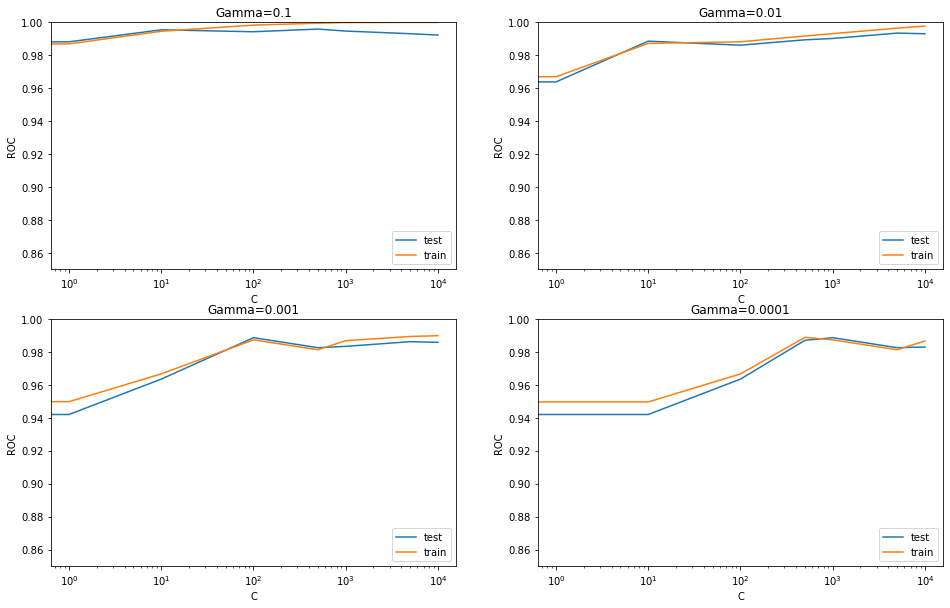

In [78]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,10))

plt.subplot(221)
gamma_1 = cv_results[cv_results['param_gamma']==0.1]

plt.plot(gamma_1["param_C"], gamma_1["mean_test_score"])
plt.plot(gamma_1["param_C"], gamma_1["mean_train_score"])
plt.xlabel('C')
plt.ylabel('ROC')
plt.title("Gamma=0.1")
plt.ylim([0.85, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')


plt.subplot(222)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('ROC')
plt.title("Gamma=0.01")
plt.ylim([0.85, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')

# subplot 2/3
plt.subplot(223)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('ROC')
plt.title("Gamma=0.001")
plt.ylim([0.85, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')


# subplot 3/3
plt.subplot(224)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('ROC')
plt.title("Gamma=0.0001")
plt.ylim([0.85, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')
plt.savefig("svc_hp_1.jpg")

### Final SVC Model

In [79]:
svcmodel = SVC(kernel='rbf', class_weight ="balanced", gamma=0.1, C=10)

In [80]:
hyper_params = {'solver': ['lbfgs', 'sgd', 'adam'],}

# specify model
model = MLPClassifier(random_state=1,max_iter = 10)

# set up GridSearchCV()
folds = 5
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)     

# fit the model
model_cv.fit(X_train_acpe, y_train_acpe) 

Fitting 5 folds for each of 3 candidates, totalling 15 fits


GridSearchCV(cv=5, estimator=MLPClassifier(max_iter=10, random_state=1),
             param_grid={'solver': ['lbfgs', 'sgd', 'adam']},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [81]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.031897,0.036944,0.002307,0.000416,lbfgs,{'solver': 'lbfgs'},1.000000,1.000000,0.995960,0.997980,...,0.998788,0.001616,1,0.999365,0.999238,0.999873,0.999619,0.997475,0.999114,0.000848
1,0.014339,0.001286,0.002418,0.000378,sgd,{'solver': 'sgd'},0.644444,0.478788,0.650505,0.656566,...,0.615813,0.068623,3,0.609954,0.640427,0.598146,0.603479,0.614520,0.613305,0.014660
2,0.016142,0.002033,0.002506,0.000317,adam,{'solver': 'adam'},0.727273,0.658586,0.747475,0.763636,...,0.728154,0.036654,2,0.726384,0.744286,0.729177,0.723591,0.720833,0.728854,0.008202


In [82]:
hyper_params = {'activation': ['logistic', 'tanh', 'relu'],}

# specify model
model = MLPClassifier(random_state=1, solver = 'lbfgs',max_iter = 50)

# set up GridSearchCV()
folds = 5
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)     

# fit the model
model_cv.fit(X_train_acpe, y_train_acpe) 

Fitting 5 folds for each of 3 candidates, totalling 15 fits


GridSearchCV(cv=5,
             estimator=MLPClassifier(max_iter=50, random_state=1,
                                     solver='lbfgs'),
             param_grid={'activation': ['logistic', 'tanh', 'relu']},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [83]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_activation,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.059258,0.006430,0.002901,0.000578,logistic,{'activation': 'logistic'},1.0,1.0,0.993939,0.991919,...,0.997172,0.003522,1,0.999746,0.999238,1.0,0.999873,0.999242,0.999620,0.000320
1,0.063668,0.005387,0.003309,0.001069,tanh,{'activation': 'tanh'},1.0,1.0,0.987879,0.991919,...,0.995960,0.005111,2,0.999746,0.999365,1.0,1.000000,0.999369,0.999696,0.000284
2,0.070676,0.016631,0.002715,0.000397,relu,{'activation': 'relu'},1.0,1.0,0.993939,0.948485,...,0.988485,0.020137,3,0.999619,0.999365,1.0,1.000000,0.999369,0.999671,0.000284


In [84]:
hyper_params = {'max_iter': [10,50,100,200,300], 
                'alpha': [1, 0.1, 0.01, 0.0001, 0.0001,0.00001]}

# specify model
model = MLPClassifier(random_state=1, solver = 'lbfgs', activation = 'logistic' ,max_iter = 50)

# set up GridSearchCV()
folds = 5
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'roc_auc', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)     

# fit the model
model_cv.fit(X_train_base, y_train_base) 

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=5,
             estimator=MLPClassifier(activation='logistic', max_iter=50,
                                     random_state=1, solver='lbfgs'),
             param_grid={'alpha': [1, 0.1, 0.01, 0.0001, 0.0001, 1e-05],
                         'max_iter': [10, 50, 100, 200, 300]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [85]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_max_iter,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.016744,0.004422,0.002513,0.000456,1,10,"{'alpha': 1, 'max_iter': 10}",0.866667,0.650505,0.761616,...,0.788935,0.083429,30,0.826308,0.737049,0.803327,0.792407,0.815152,0.794848,0.031050
1,0.071085,0.010654,0.002707,0.000246,1,50,"{'alpha': 1, 'max_iter': 50}",0.886869,0.836364,0.864646,...,0.863021,0.034043,24,0.869985,0.863890,0.859446,0.858939,0.880303,0.866513,0.007955
2,0.119217,0.020746,0.005013,0.001647,1,100,"{'alpha': 1, 'max_iter': 100}",0.886869,0.836364,0.864646,...,0.864242,0.034649,21,0.869731,0.863890,0.859573,0.858939,0.879924,0.866411,0.007779
3,0.143482,0.021163,0.003208,0.000511,1,200,"{'alpha': 1, 'max_iter': 200}",0.886869,0.836364,0.864646,...,0.864242,0.034649,21,0.869731,0.863890,0.859573,0.858939,0.879924,0.866411,0.007779
4,0.125633,0.022246,0.004512,0.002080,1,300,"{'alpha': 1, 'max_iter': 300}",0.886869,0.836364,0.864646,...,0.864242,0.034649,21,0.869731,0.863890,0.859573,0.858939,0.879924,0.866411,0.007779
5,0.025066,0.002923,0.005617,0.001807,0.1,10,"{'alpha': 0.1, 'max_iter': 10}",0.860606,0.680808,0.763636,...,0.793792,0.071328,29,0.810437,0.754698,0.798629,0.787456,0.804293,0.791102,0.019713
6,0.111294,0.011553,0.003710,0.000931,0.1,50,"{'alpha': 0.1, 'max_iter': 50}",0.882828,0.886869,0.923232,...,0.895556,0.023154,20,0.931183,0.901473,0.899568,0.898172,0.904798,0.907039,0.012275
7,0.201435,0.014249,0.005415,0.002137,0.1,100,"{'alpha': 0.1, 'max_iter': 100}",0.870707,0.901010,0.929293,...,0.908641,0.025424,18,0.937532,0.914424,0.917090,0.912011,0.921086,0.920428,0.009067
8,0.357774,0.061936,0.003507,0.001052,0.1,200,"{'alpha': 0.1, 'max_iter': 200}",0.864646,0.903030,0.931313,...,0.910257,0.030269,16,0.939563,0.918360,0.918740,0.913916,0.922854,0.922687,0.008900
9,0.353641,0.079758,0.003202,0.000514,0.1,300,"{'alpha': 0.1, 'max_iter': 300}",0.862626,0.903030,0.933333,...,0.911093,0.030266,15,0.939436,0.918360,0.924835,0.914170,0.925758,0.924512,0.008593


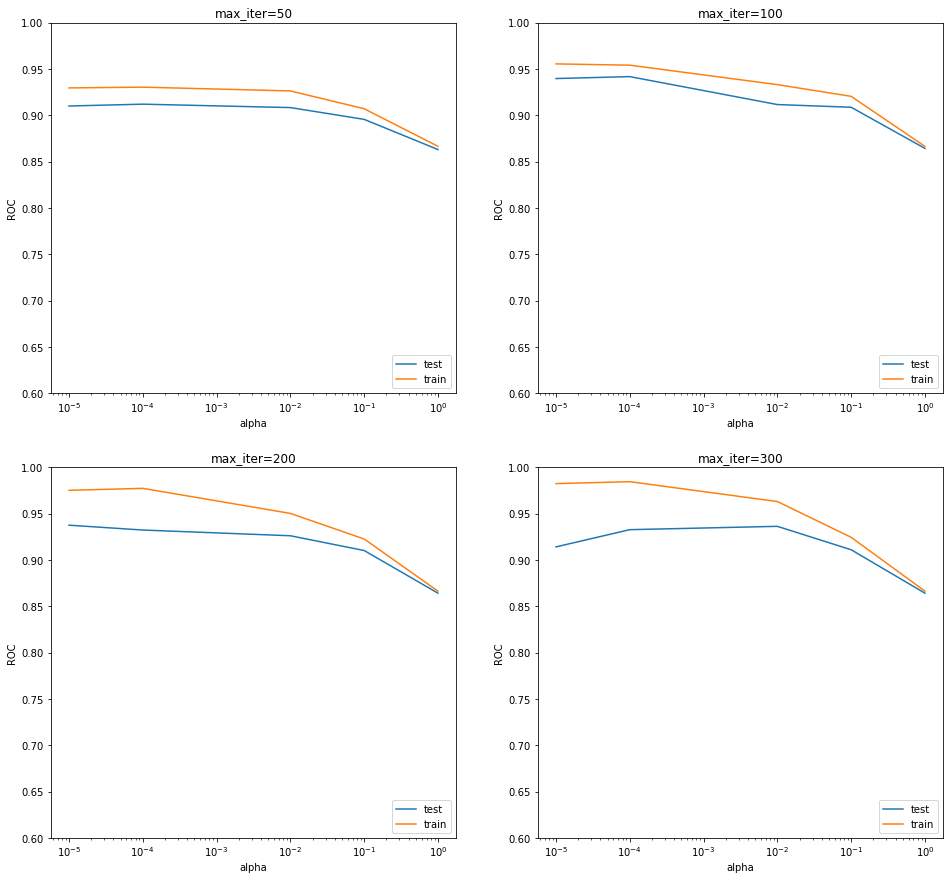

In [86]:
# converting C to numeric type for plotting on x-axis
cv_results['param_alpha'] = cv_results['param_alpha'].astype("double")
cv_results['param_max_iter'] = cv_results['param_max_iter'].astype("double")

# # plotting
plt.figure(figsize=(16,15))

plt.subplot(221)
max_iter_1 = cv_results[cv_results['param_max_iter']==50]

plt.plot(max_iter_1["param_alpha"], max_iter_1["mean_test_score"])
plt.plot(max_iter_1["param_alpha"], max_iter_1["mean_train_score"])
plt.xlabel('alpha')
plt.ylabel('ROC')
plt.title("max_iter=50")
plt.ylim([0.6, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')


plt.subplot(222)
max_iter_2 = cv_results[cv_results['param_max_iter']==100]

plt.plot(max_iter_2["param_alpha"], max_iter_2["mean_test_score"])
plt.plot(max_iter_2["param_alpha"], max_iter_2["mean_train_score"])
plt.xlabel('alpha')
plt.ylabel('ROC')
plt.title("max_iter=100")
plt.ylim([0.6, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')


plt.subplot(223)
max_iter_3 = cv_results[cv_results['param_max_iter']==200]

plt.plot(max_iter_3["param_alpha"], max_iter_3["mean_test_score"])
plt.plot(max_iter_3["param_alpha"], max_iter_3["mean_train_score"])
plt.xlabel('alpha')
plt.ylabel('ROC')
plt.title("max_iter=200")
plt.ylim([0.6, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')


plt.subplot(224)
max_iter_4 = cv_results[cv_results['param_max_iter']==300]

plt.plot(max_iter_4["param_alpha"], max_iter_4["mean_test_score"])
plt.plot(max_iter_4["param_alpha"], max_iter_4["mean_train_score"])
plt.xlabel('alpha')
plt.ylabel('ROC')
plt.title("max_iter=300")
plt.ylim([0.6, 1])
plt.legend(['test', 'train'], loc='lower right')
plt.xscale('log')
plt.savefig("ann_hp_1.jpg")

In [87]:
model_cv.best_params_

{'alpha': 0.0001, 'max_iter': 100}

### Final ANN model

In [88]:
annmodel = MLPClassifier(random_state=1, solver = 'lbfgs', activation = 'logistic', alpha=0.0001, max_iter=100)

In [89]:
annmodel.fit(X_train_acpi, y_train_acpi) 

MLPClassifier(activation='logistic', max_iter=100, random_state=1,
              solver='lbfgs')

In [91]:
mixed_data = pd.concat([acpe, carc,acpi,axial,base])

In [92]:
mixed_data.head()

,TD1,TD3,TD4,TD7,TD10,TD11,FD2,FD3,FD6,FD7,Motor Condition
0,0.195833,3.648883,13.314349,3.654123,18.659418,1431.670141,1431.674804,2049692.745,1431.670141,229943.4728,0
1,0.195832,3.660153,13.396718,3.665376,18.716939,1436.079128,1436.083786,2062336.642,1436.079128,211571.5814,0
2,0.198418,3.997891,15.983133,4.002799,20.173600,1568.280017,1568.285069,2459518.058,1568.280017,248809.2020,0
3,0.197908,3.490730,12.185196,3.496324,17.666444,1369.845416,1369.849865,1876488.653,1369.845416,216264.3433,0
4,0.196435,3.823409,14.618454,3.828439,19.489583,1499.966573,1499.971459,2249914.378,1499.966573,274060.1290,0


In [94]:
df_train_mixed_data, df_test_mixed_data = train_test_split(mixed_data,train_size=0.7,random_state=100)
scaler_mixed_data = MinMaxScaler()
df_train_mixed_data[selected_col] = scaler_mixed_data.fit_transform(df_train_mixed_data[selected_col])
y_train_mixed_data = df_train_mixed_data.pop("Motor Condition")
X_train_mixed_data = df_train_mixed_data

In [95]:
def svcfinalmodel(X_train,y_train):
    
    svcmodel = SVC(kernel='rbf', class_weight ="balanced", gamma=0.1, C=100, probability=True)
    svcmodel.fit(X_train, y_train)    
    y_pred = svcmodel.predict(X_train)
    
    Accuracy = metrics.accuracy_score(y_pred=y_pred, y_true=y_train)
    print("SVC Train Results")
    print("Train Accuarcy model  : {0}".format(Accuracy))
    print("Confusion Matrix")
    print(confusion_matrix(y_train, y_pred))
    print("train classification Report")
    print(classification_report(y_train, y_pred))
    print("*************************************************************")
    return(svcmodel)

In [96]:
def annfinalmodel(X_train,y_train):
    
    annmodel = MLPClassifier(random_state=1, solver = 'lbfgs', activation = 'logistic', alpha=0.0001, max_iter=100)
    annmodel.fit(X_train, y_train)    
    y_pred = annmodel.predict(X_train)
    
    Accuracy = metrics.accuracy_score(y_pred=y_pred, y_true=y_train)
    print("ANN Train Results")
    print("Train Accuarcy model  : {0}".format(Accuracy))
    print("Confusion Matrix")
    print(confusion_matrix(y_train, y_pred))
    print("train classification Report")
    print(classification_report(y_train, y_pred))
    print("*************************************************************")
    return(annmodel)


In [97]:
svcfinalmodel(X_train_acpi, y_train_acpi)
annfinalmodel(X_train_acpi, y_train_acpi)

SVC Train Results
Train Accuarcy model  : 0.974910394265233
Confusion Matrix
[[ 54   1]
 [  6 218]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.98      0.94        55
         1.0       1.00      0.97      0.98       224

    accuracy                           0.97       279
   macro avg       0.95      0.98      0.96       279
weighted avg       0.98      0.97      0.98       279

*************************************************************
ANN Train Results
Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279

******************************************

MLPClassifier(activation='logistic', max_iter=100, random_state=1,
              solver='lbfgs')

In [98]:
mixed_data1 = pd.concat([acpi, carc])
mixed_data2 = pd.concat([acpe,base,axial])

In [99]:
df_train_mixed_data1, df_test_mixed_data1 = train_test_split(mixed_data1,train_size=0.7,random_state=100)
scaler_mixed_data1 = MinMaxScaler()
df_train_mixed_data1[selected_col] = scaler_mixed_data1.fit_transform(df_train_mixed_data1[selected_col])
y_train_mixed_data1 = df_train_mixed_data1.pop("Motor Condition")
X_train_mixed_data1 = df_train_mixed_data1

In [100]:
df_train_mixed_data2, df_test_mixed_data2 = train_test_split(mixed_data2,train_size=0.7,random_state=100)
scaler_mixed_data2 = MinMaxScaler()
df_train_mixed_data2[selected_col] = scaler_mixed_data2.fit_transform(df_train_mixed_data2[selected_col])
y_train_mixed_data2 = df_train_mixed_data2.pop("Motor Condition")
X_train_mixed_data2 = df_train_mixed_data2

In [101]:
annfinalmodel(X_train_mixed_data1, y_train_mixed_data1)

ANN Train Results
Train Accuarcy model  : 0.9498207885304659
Confusion Matrix
[[100  14]
 [ 14 430]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88       114
         1.0       0.97      0.97      0.97       444

    accuracy                           0.95       558
   macro avg       0.92      0.92      0.92       558
weighted avg       0.95      0.95      0.95       558

*************************************************************


MLPClassifier(activation='logistic', max_iter=100, random_state=1,
              solver='lbfgs')

In [102]:
svcfinalmodel(X_train_mixed_data1, y_train_mixed_data1)

SVC Train Results
Train Accuarcy model  : 0.8853046594982079
Confusion Matrix
[[106   8]
 [ 56 388]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.65      0.93      0.77       114
         1.0       0.98      0.87      0.92       444

    accuracy                           0.89       558
   macro avg       0.82      0.90      0.85       558
weighted avg       0.91      0.89      0.89       558

*************************************************************


SVC(C=100, class_weight='balanced', gamma=0.1, probability=True)

In [103]:
annfinalmodel(X_train_mixed_data2, y_train_mixed_data2)

ANN Train Results
Train Accuarcy model  : 0.7992831541218638
Confusion Matrix
[[  0 168]
 [  0 669]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       168
         1.0       0.80      1.00      0.89       669

    accuracy                           0.80       837
   macro avg       0.40      0.50      0.44       837
weighted avg       0.64      0.80      0.71       837

*************************************************************


MLPClassifier(activation='logistic', max_iter=100, random_state=1,
              solver='lbfgs')

In [104]:
svcfinalmodel(X_train_mixed_data2, y_train_mixed_data2)

SVC Train Results
Train Accuarcy model  : 0.4767025089605735
Confusion Matrix
[[132  36]
 [402 267]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.25      0.79      0.38       168
         1.0       0.88      0.40      0.55       669

    accuracy                           0.48       837
   macro avg       0.56      0.59      0.46       837
weighted avg       0.75      0.48      0.51       837

*************************************************************


SVC(C=100, class_weight='balanced', gamma=0.1, probability=True)

## Model Validation

In [105]:
def modelpredict(model,X_test,y_test,modelname):
  
    y_pred = model.predict(X_test)
    
    Accuracy = metrics.accuracy_score(y_pred=y_pred, y_true=y_test)
    print(modelname+" Test Results")
    print("test Accuarcy model  : {0}".format(Accuracy))
    print("Confusion Matrix")
    print(confusion_matrix(y_test, y_pred))
    print("test classification Report")
    print(classification_report(y_test, y_pred))
    print("*************************************************************")

In [106]:
df_test_acpi[selected_col] = scaler_acpi.transform(df_test_acpi[selected_col])
y_test_acpi = df_test_acpi.pop("Motor Condition")
X_test_acpi = df_test_acpi

In [107]:
model_svc_acpi=svcfinalmodel(X_train_acpi, y_train_acpi)
modelpredict(model_svc_acpi,X_test_acpi, y_test_acpi,'SVC')

SVC Train Results
Train Accuarcy model  : 0.974910394265233
Confusion Matrix
[[ 54   1]
 [  6 218]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.98      0.94        55
         1.0       1.00      0.97      0.98       224

    accuracy                           0.97       279
   macro avg       0.95      0.98      0.96       279
weighted avg       0.98      0.97      0.98       279

*************************************************************
SVC Test Results
test Accuarcy model  : 0.9666666666666667
Confusion Matrix
[[24  1]
 [ 3 92]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.96      0.92        25
         1.0       0.99      0.97      0.98        95

    accuracy                           0.97       120
   macro avg       0.94      0.96      0.95       120
weighted avg       0.97      0.97      0.97       120

**********************************

In [108]:
model_ann_acpi=annfinalmodel(X_train_acpi, y_train_acpi)
modelpredict(model_ann_acpi,X_test_acpi, y_test_acpi,'ANN')

ANN Train Results
Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279

*************************************************************
ANN Test Results
test Accuarcy model  : 1.0
Confusion Matrix
[[25  0]
 [ 0 95]]
test classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        25
         1.0       1.00      1.00      1.00        95

    accuracy                           1.00       120
   macro avg       1.00      1.00      1.00       120
weighted avg       1.00      1.00      1.00       120

*************************************************************


In [109]:
df_test_carc[selected_col] = scaler_carc.transform(df_test_carc[selected_col])
y_test_carc = df_test_carc.pop("Motor Condition")
X_test_carc = df_test_carc

In [110]:
model_svc_carc=svcfinalmodel(X_train_carc, y_train_carc)
modelpredict(model_svc_carc,X_test_carc, y_test_carc,'SVC')
model_ann_carc=annfinalmodel(X_train_carc, y_train_carc)
modelpredict(model_ann_carc,X_test_carc, y_test_carc,'ANN')

SVC Train Results
Train Accuarcy model  : 0.9068100358422939
Confusion Matrix
[[ 55   0]
 [ 26 198]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.68      1.00      0.81        55
         1.0       1.00      0.88      0.94       224

    accuracy                           0.91       279
   macro avg       0.84      0.94      0.87       279
weighted avg       0.94      0.91      0.91       279

*************************************************************
SVC Test Results
test Accuarcy model  : 0.9333333333333333
Confusion Matrix
[[25  0]
 [ 8 87]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.76      1.00      0.86        25
         1.0       1.00      0.92      0.96        95

    accuracy                           0.93       120
   macro avg       0.88      0.96      0.91       120
weighted avg       0.95      0.93      0.94       120

*********************************

In [111]:
df_test_acpe[selected_col] = scaler_acpe.transform(df_test_acpe[selected_col])
y_test_acpe = df_test_acpe.pop("Motor Condition")
X_test_acpe = df_test_acpe

In [112]:
model_svc_acpe=svcfinalmodel(X_train_acpe, y_train_acpe)
modelpredict(model_svc_acpe,X_test_acpe, y_test_acpe,'SVC')
model_ann_acpe=annfinalmodel(X_train_acpe, y_train_acpe)
modelpredict(model_ann_acpe,X_test_acpe, y_test_acpe,'ANN')

SVC Train Results
Train Accuarcy model  : 0.9605734767025089
Confusion Matrix
[[ 55   0]
 [ 11 213]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.83      1.00      0.91        55
         1.0       1.00      0.95      0.97       224

    accuracy                           0.96       279
   macro avg       0.92      0.98      0.94       279
weighted avg       0.97      0.96      0.96       279

*************************************************************
SVC Test Results
test Accuarcy model  : 0.9666666666666667
Confusion Matrix
[[25  0]
 [ 4 91]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.86      1.00      0.93        25
         1.0       1.00      0.96      0.98        95

    accuracy                           0.97       120
   macro avg       0.93      0.98      0.95       120
weighted avg       0.97      0.97      0.97       120

*********************************

In [113]:
df_test_base[selected_col] = scaler_base.transform(df_test_base[selected_col])
y_test_base = df_test_base.pop("Motor Condition")
X_test_base = df_test_base


In [114]:
model_svc_base=svcfinalmodel(X_train_base, y_train_base)
modelpredict(model_svc_base,X_test_base, y_test_base,'SVC')
model_ann_base=annfinalmodel(X_train_base, y_train_base)
modelpredict(model_ann_base,X_test_base, y_test_base,'ANN')

SVC Train Results
Train Accuarcy model  : 0.8136200716845878
Confusion Matrix
[[ 46   9]
 [ 43 181]]
train classification Report
              precision    recall  f1-score   support

         0.0       0.52      0.84      0.64        55
         1.0       0.95      0.81      0.87       224

    accuracy                           0.81       279
   macro avg       0.73      0.82      0.76       279
weighted avg       0.87      0.81      0.83       279

*************************************************************
SVC Test Results
test Accuarcy model  : 0.825
Confusion Matrix
[[22  3]
 [18 77]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.55      0.88      0.68        25
         1.0       0.96      0.81      0.88        95

    accuracy                           0.82       120
   macro avg       0.76      0.85      0.78       120
weighted avg       0.88      0.82      0.84       120

**********************************************

In [115]:
df_test_axial[selected_col] = scaler_axial.transform(df_test_axial[selected_col])
y_test_axial = df_test_axial.pop("Motor Condition")
X_test_axial = df_test_axial

In [116]:
model_svc_axial=svcfinalmodel(X_train_axial, y_train_axial)
modelpredict(model_svc_axial,X_test_axial, y_test_axial,'SVC')
model_ann_axial=annfinalmodel(X_train_axial, y_train_axial)
modelpredict(model_ann_axial,X_test_axial, y_test_axial,'ANN')

SVC Train Results
Train Accuarcy model  : 1.0
Confusion Matrix
[[ 55   0]
 [  0 224]]
train classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        55
         1.0       1.00      1.00      1.00       224

    accuracy                           1.00       279
   macro avg       1.00      1.00      1.00       279
weighted avg       1.00      1.00      1.00       279

*************************************************************
SVC Test Results
test Accuarcy model  : 1.0
Confusion Matrix
[[25  0]
 [ 0 95]]
test classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        25
         1.0       1.00      1.00      1.00        95

    accuracy                           1.00       120
   macro avg       1.00      1.00      1.00       120
weighted avg       1.00      1.00      1.00       120

*************************************************************
A

In [117]:
modelpredict(model_svc_axial,X_test_base, y_test_base,'SVC')
modelpredict(model_ann_axial,X_test_base, y_test_base,'ANN')

SVC Test Results
test Accuarcy model  : 0.8666666666666667
Confusion Matrix
[[22  3]
 [13 82]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.63      0.88      0.73        25
         1.0       0.96      0.86      0.91        95

    accuracy                           0.87       120
   macro avg       0.80      0.87      0.82       120
weighted avg       0.89      0.87      0.87       120

*************************************************************
ANN Test Results
test Accuarcy model  : 0.8833333333333333
Confusion Matrix
[[19  6]
 [ 8 87]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.70      0.76      0.73        25
         1.0       0.94      0.92      0.93        95

    accuracy                           0.88       120
   macro avg       0.82      0.84      0.83       120
weighted avg       0.89      0.88      0.88       120

****************************************

In [118]:
modelpredict(model_svc_axial,X_test_acpe, y_test_acpe,'SVC')
modelpredict(model_ann_axial,X_test_acpe, y_test_acpe,'ANN')

SVC Test Results
test Accuarcy model  : 0.9083333333333333
Confusion Matrix
[[25  0]
 [11 84]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.69      1.00      0.82        25
         1.0       1.00      0.88      0.94        95

    accuracy                           0.91       120
   macro avg       0.85      0.94      0.88       120
weighted avg       0.94      0.91      0.91       120

*************************************************************
ANN Test Results
test Accuarcy model  : 0.9916666666666667
Confusion Matrix
[[25  0]
 [ 1 94]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98        25
         1.0       1.00      0.99      0.99        95

    accuracy                           0.99       120
   macro avg       0.98      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120

****************************************

In [119]:
modelpredict(model_svc_axial,X_test_carc, y_test_carc,'SVC')
modelpredict(model_ann_axial,X_test_carc, y_test_carc,'ANN')

SVC Test Results
test Accuarcy model  : 0.9166666666666666
Confusion Matrix
[[22  3]
 [ 7 88]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.76      0.88      0.81        25
         1.0       0.97      0.93      0.95        95

    accuracy                           0.92       120
   macro avg       0.86      0.90      0.88       120
weighted avg       0.92      0.92      0.92       120

*************************************************************
ANN Test Results
test Accuarcy model  : 0.9333333333333333
Confusion Matrix
[[20  5]
 [ 3 92]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.80      0.83        25
         1.0       0.95      0.97      0.96        95

    accuracy                           0.93       120
   macro avg       0.91      0.88      0.90       120
weighted avg       0.93      0.93      0.93       120

****************************************

In [120]:
modelpredict(model_svc_axial,X_test_acpi, y_test_acpi,'SVC')
modelpredict(model_ann_axial,X_test_acpi, y_test_acpi,'ANN')

SVC Test Results
test Accuarcy model  : 0.275
Confusion Matrix
[[ 0 25]
 [62 33]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.57      0.35      0.43        95

    accuracy                           0.28       120
   macro avg       0.28      0.17      0.22       120
weighted avg       0.45      0.28      0.34       120

*************************************************************
ANN Test Results
test Accuarcy model  : 0.25833333333333336
Confusion Matrix
[[ 0 25]
 [64 31]]
test classification Report
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        25
         1.0       0.55      0.33      0.41        95

    accuracy                           0.26       120
   macro avg       0.28      0.16      0.21       120
weighted avg       0.44      0.26      0.33       120

****************************************************

In [121]:
# Method to plot the confusion matrix
def plot_confusion_matrix(model, X_test, y_test, name, m_name, classes, normalize=False, title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
    print(m_name)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.title(name)
    plt.savefig(m_name+"_"+name+"_cm.jpg")
    plt.show()

SVC
Confusion matrix
[[25  0]
 [ 0 95]]


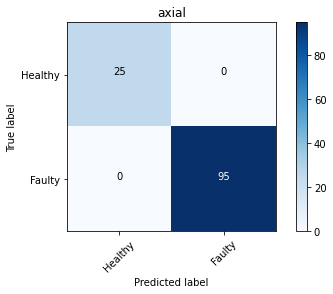

In [122]:
plot_confusion_matrix(model_svc_axial, X_test_axial, y_test_axial, "axial", "SVC", classes=['Healthy', 'Faulty'])

In [123]:
def plot_roc(model,X_test,y_test,name,m_name):
    
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    roc_value = roc_auc_score(y_test, y_pred_prob)
    print(m_name+ " roc_value: {0}" .format(roc_value))
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_prob)
    threshold = thresholds[np.argmax(tpr-fpr)]
    print(m_name+" threshold: {0}".format(threshold))

    roc_auc = metrics.auc(fpr, tpr)
    print("ROC for the test dataset",'{:.1%}'.format(roc_auc))
    plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
    plt.legend(loc=4)
    plt.title(name)
    plt.savefig(m_name+"_"+name+"_roc.jpg")
    plt.show()
    print("**********************************************************************************")

SVC roc_value: 1.0
SVC threshold: 0.9708576863568574
ROC for the test dataset 100.0%


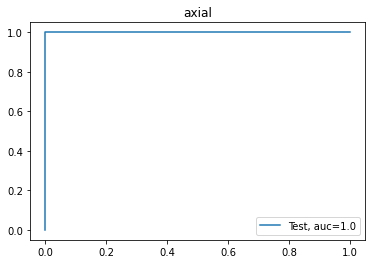

**********************************************************************************


In [124]:
plot_roc(model_svc_axial, X_test_axial, y_test_axial, "axial", "SVC")

ANN
Confusion matrix
[[25  0]
 [ 0 95]]


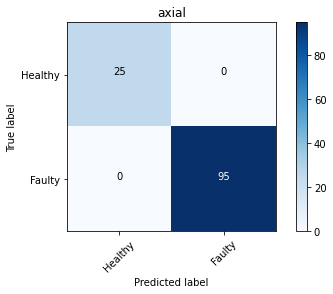

ANN roc_value: 1.0
ANN threshold: 0.9989538419092453
ROC for the test dataset 100.0%


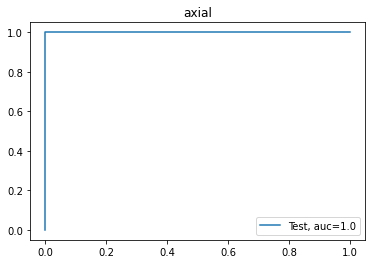

**********************************************************************************


In [125]:
plot_confusion_matrix(model_ann_axial, X_test_axial, y_test_axial, "axial", "ANN", classes=['Healthy', 'Faulty'])
plot_roc(model_ann_axial, X_test_axial, y_test_axial, "axial", "ANN")

SVC
Confusion matrix
[[22  3]
 [18 77]]


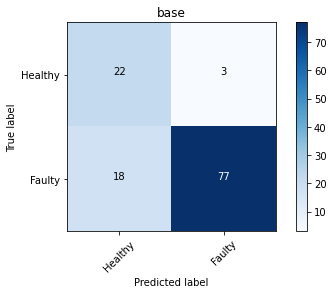

SVC roc_value: 0.9427368421052632
SVC threshold: 0.8435024020263477
ROC for the test dataset 94.3%


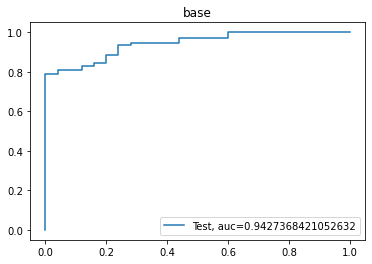

**********************************************************************************
ANN
Confusion matrix
[[18  7]
 [ 5 90]]


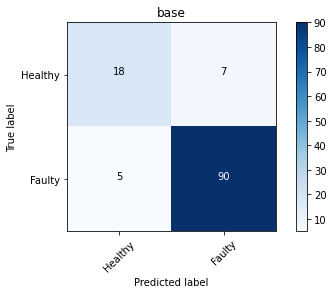

ANN roc_value: 0.9591578947368421
ANN threshold: 0.9205434306327056
ROC for the test dataset 95.9%


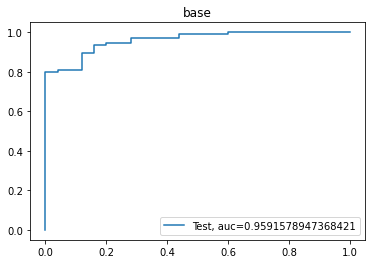

**********************************************************************************


In [126]:
plot_confusion_matrix(model_svc_base, X_test_base, y_test_base, "base", "SVC", classes=['Healthy', 'Faulty'])
plot_roc(model_svc_base, X_test_base, y_test_base, "base", "SVC")
plot_confusion_matrix(model_ann_base, X_test_base, y_test_base, "base", "ANN", classes=['Healthy', 'Faulty'])
plot_roc(model_ann_base, X_test_base, y_test_base, "base", "ANN")

SVC
Confusion matrix
[[25  0]
 [ 4 91]]


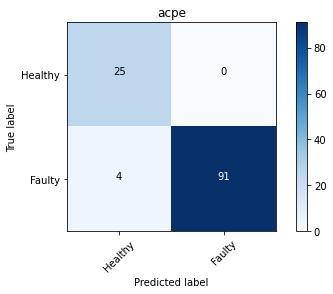

SVC roc_value: 1.0
SVC threshold: 0.5669530252912263
ROC for the test dataset 100.0%


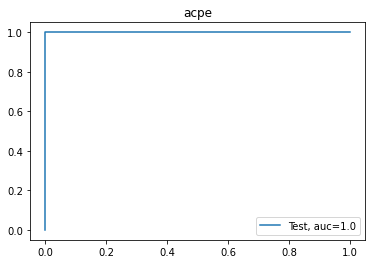

**********************************************************************************
ANN
Confusion matrix
[[25  0]
 [ 0 95]]


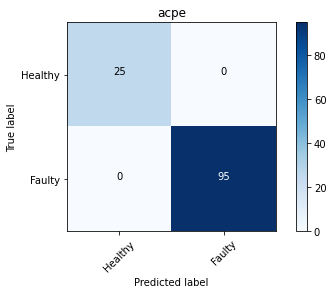

ANN roc_value: 1.0
ANN threshold: 0.8555745281874216
ROC for the test dataset 100.0%


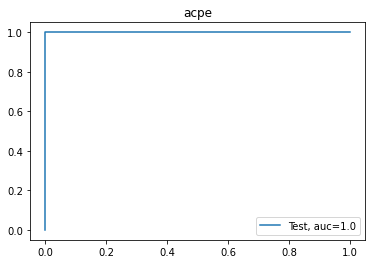

**********************************************************************************


In [127]:
plot_confusion_matrix(model_svc_acpe, X_test_acpe, y_test_acpe, "acpe", "SVC", classes=['Healthy', 'Faulty'])
plot_roc(model_svc_acpe, X_test_acpe, y_test_acpe, "acpe", "SVC")
plot_confusion_matrix(model_ann_acpe, X_test_acpe, y_test_acpe, "acpe", "ANN", classes=['Healthy', 'Faulty'])
plot_roc(model_ann_acpe, X_test_acpe, y_test_acpe, "acpe", "ANN")

SVC
Confusion matrix
[[24  1]
 [ 3 92]]


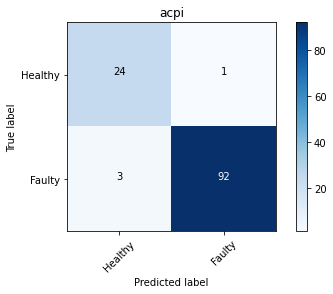

SVC roc_value: 0.9962105263157894
SVC threshold: 0.8447973841353991
ROC for the test dataset 99.6%


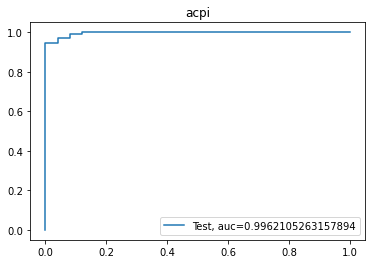

**********************************************************************************
ANN
Confusion matrix
[[25  0]
 [ 0 95]]


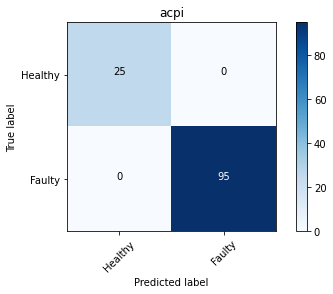

ANN roc_value: 1.0
ANN threshold: 0.9277507812330337
ROC for the test dataset 100.0%


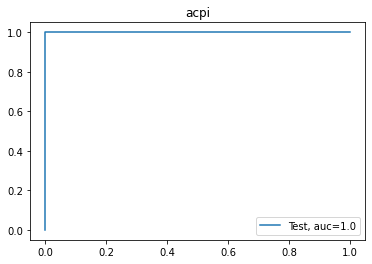

**********************************************************************************


In [128]:
plot_confusion_matrix(model_svc_acpi, X_test_acpi, y_test_acpi, "acpi", "SVC", classes=['Healthy', 'Faulty'])
plot_roc(model_svc_acpi, X_test_acpi, y_test_acpi, "acpi", "SVC")
plot_confusion_matrix(model_ann_acpi, X_test_acpi, y_test_acpi, "acpi", "ANN", classes=['Healthy', 'Faulty'])
plot_roc(model_ann_acpi, X_test_acpi, y_test_acpi, "acpi", "ANN")

SVC
Confusion matrix
[[25  0]
 [ 8 87]]


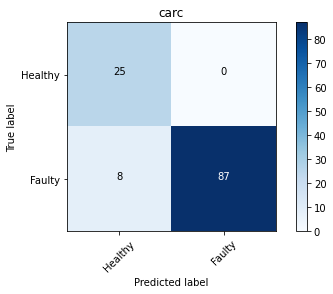

SVC roc_value: 0.9802105263157895
SVC threshold: 0.829863109816196
ROC for the test dataset 98.0%


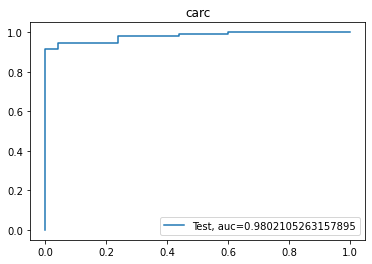

**********************************************************************************
ANN
Confusion matrix
[[21  4]
 [ 2 93]]


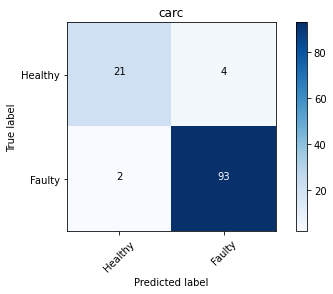

ANN roc_value: 0.992421052631579
ANN threshold: 0.6803905442094774
ROC for the test dataset 99.2%


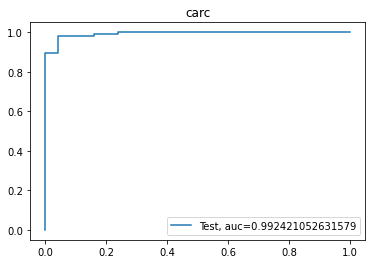

**********************************************************************************


In [129]:
plot_confusion_matrix(model_svc_carc, X_test_carc, y_test_carc, "carc", "SVC", classes=['Healthy', 'Faulty'])
plot_roc(model_svc_carc, X_test_carc, y_test_carc, "carc", "SVC")
plot_confusion_matrix(model_ann_carc, X_test_carc, y_test_carc, "carc", "ANN", classes=['Healthy', 'Faulty'])
plot_roc(model_ann_carc, X_test_carc, y_test_carc, "carc", "ANN")

In [145]:
df_healthy_acpi = acpi.iloc[1:80,:]

df_1brb_acpi = pd.concat([df_healthy_acpi, acpi.iloc[80:160,:]])
df_1brb_acpi[selected_col] = scaler_acpi.transform(df_1brb_acpi[selected_col])
y_test_acpi_1brb = df_1brb_acpi.pop("Motor Condition")
X_test_acpi_1brb = df_1brb_acpi

df_2brb_acpi = pd.concat([df_healthy_acpi, acpi.iloc[160:240,:]])
df_2brb_acpi[selected_col] = scaler_acpi.transform(df_2brb_acpi[selected_col])
y_test_acpi_2brb = df_2brb_acpi.pop("Motor Condition")
X_test_acpi_2brb = df_2brb_acpi

df_3brb_acpi = pd.concat([df_healthy_acpi, acpi.iloc[240:320,:]])
df_3brb_acpi[selected_col] = scaler_acpi.transform(df_3brb_acpi[selected_col])
y_test_acpi_3brb = df_3brb_acpi.pop("Motor Condition")
X_test_acpi_3brb = df_3brb_acpi

df_4brb_acpi = pd.concat([df_healthy_acpi, acpi.iloc[320:400,:]])
df_4brb_acpi[selected_col] = scaler_acpi.transform(df_4brb_acpi[selected_col])
y_test_acpi_4brb = df_4brb_acpi.pop("Motor Condition")
X_test_acpi_4brb = df_4brb_acpi

In [131]:
X_test_acpi_2brb.shape

(160, 10)

In [146]:
df_healthy_acpe = acpe.iloc[1:80,:]

df_1brb_acpe = pd.concat([df_healthy_acpe, acpe.iloc[80:160,:]])
df_1brb_acpe[selected_col] = scaler_acpe.transform(df_1brb_acpe[selected_col])
y_test_acpe_1brb = df_1brb_acpe.pop("Motor Condition")
X_test_acpe_1brb = df_1brb_acpe

df_2brb_acpe = pd.concat([df_healthy_acpe, acpe.iloc[160:240,:]])
df_2brb_acpe[selected_col] = scaler_acpe.transform(df_2brb_acpe[selected_col])
y_test_acpe_2brb = df_2brb_acpe.pop("Motor Condition")
X_test_acpe_2brb = df_2brb_acpe

df_3brb_acpe = pd.concat([df_healthy_acpe, acpe.iloc[240:320,:]])
df_3brb_acpe[selected_col] = scaler_acpe.transform(df_3brb_acpe[selected_col])
y_test_acpe_3brb = df_3brb_acpe.pop("Motor Condition")
X_test_acpe_3brb = df_3brb_acpe

df_4brb_acpe = pd.concat([df_healthy_acpe, acpe.iloc[320:400,:]])
df_4brb_acpe[selected_col] = scaler_acpe.transform(df_4brb_acpe[selected_col])
y_test_acpe_4brb = df_4brb_acpe.pop("Motor Condition")
X_test_acpe_4brb = df_4brb_acpe

SVC roc_value: 0.9992088607594937
SVC threshold: 0.45346222327626695
ROC for the test dataset 99.9%


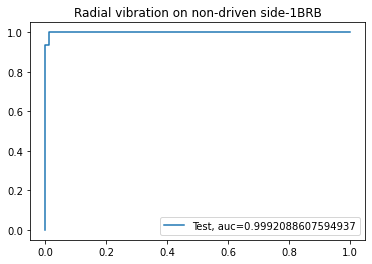

**********************************************************************************
SVC roc_value: 1.0
SVC threshold: 0.9801734262885423
ROC for the test dataset 100.0%


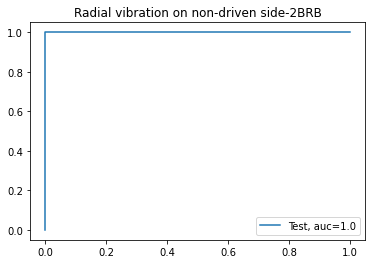

**********************************************************************************
SVC roc_value: 0.9993749023284888
SVC threshold: 0.5457709918120379
ROC for the test dataset 99.9%


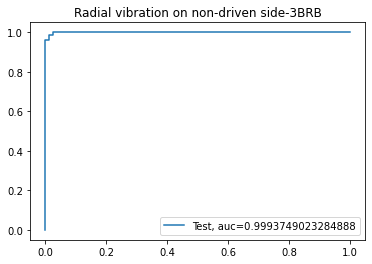

**********************************************************************************
SVC roc_value: 1.0
SVC threshold: 0.9510664057650975
ROC for the test dataset 100.0%


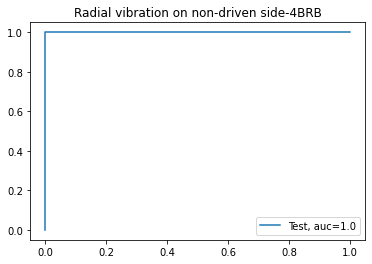

**********************************************************************************


In [133]:
plot_roc(model_svc_acpe, X_test_acpe_1brb, y_test_acpe_1brb, "Radial vibration on non-driven side-1BRB", "SVC")
plot_roc(model_svc_acpe, X_test_acpe_2brb, y_test_acpe_2brb, "Radial vibration on non-driven side-2BRB", "SVC")
plot_roc(model_svc_acpe, X_test_acpe_3brb, y_test_acpe_3brb, "Radial vibration on non-driven side-3BRB", "SVC")
plot_roc(model_svc_acpe, X_test_acpe_4brb, y_test_acpe_4brb, "Radial vibration on non-driven side-4BRB", "SVC")

ANN roc_value: 0.9995253164556962
ANN threshold: 0.6739813512540105
ROC for the test dataset 100.0%


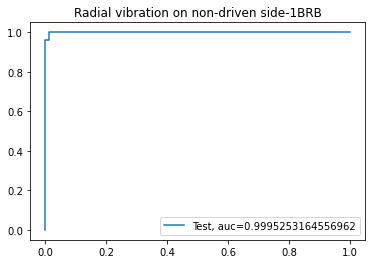

**********************************************************************************
ANN roc_value: 1.0
ANN threshold: 0.999999983657599
ROC for the test dataset 100.0%


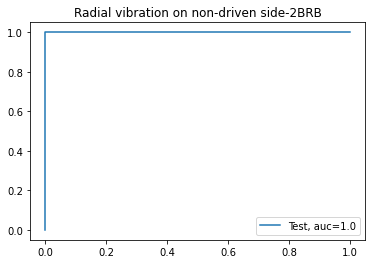

**********************************************************************************
ANN roc_value: 0.9996874511642444
ANN threshold: 0.33276455205614225
ROC for the test dataset 100.0%


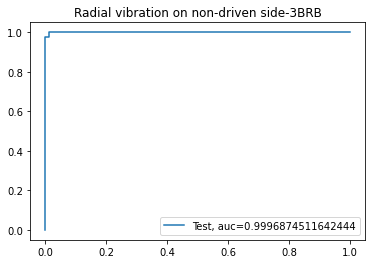

**********************************************************************************
ANN roc_value: 1.0
ANN threshold: 0.9999989134872603
ROC for the test dataset 100.0%


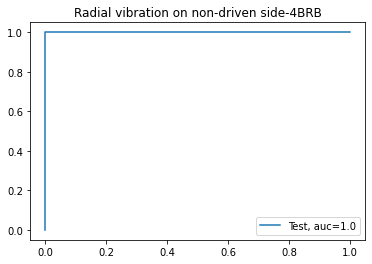

**********************************************************************************


In [134]:
plot_roc(model_ann_acpe, X_test_acpe_1brb, y_test_acpe_1brb, "Radial vibration on non-driven side-1BRB", "ANN")
plot_roc(model_ann_acpe, X_test_acpe_2brb, y_test_acpe_2brb, "Radial vibration on non-driven side-2BRB", "ANN")
plot_roc(model_ann_acpe, X_test_acpe_3brb, y_test_acpe_3brb, "Radial vibration on non-driven side-3BRB", "ANN")
plot_roc(model_ann_acpe, X_test_acpe_4brb, y_test_acpe_4brb, "Radial vibration on non-driven side-4BRB", "ANN")

SVC roc_value: 0.9908227848101266
SVC threshold: 0.5942029638751771
ROC for the test dataset 99.1%


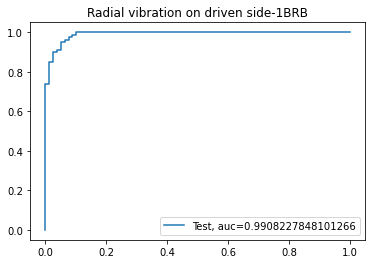

**********************************************************************************
SVC roc_value: 0.9998437255821222
SVC threshold: 0.9504869864446702
ROC for the test dataset 100.0%


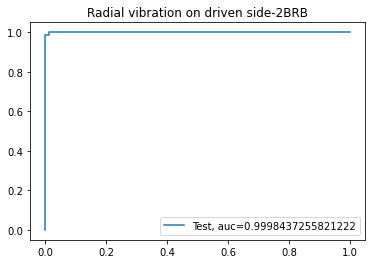

**********************************************************************************
SVC roc_value: 1.0
SVC threshold: 0.9157715114642683
ROC for the test dataset 100.0%


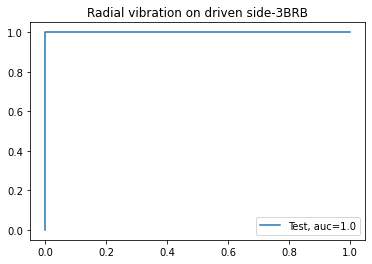

**********************************************************************************
SVC roc_value: 1.0
SVC threshold: 0.9854842458320798
ROC for the test dataset 100.0%


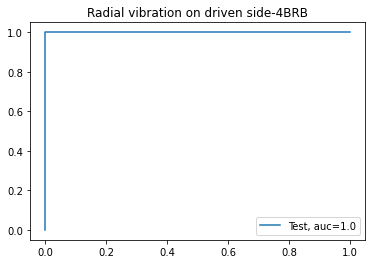

**********************************************************************************


In [135]:
plot_roc(model_svc_acpi, X_test_acpi_1brb, y_test_acpi_1brb, "Radial vibration on driven side-1BRB", "SVC")
plot_roc(model_svc_acpi, X_test_acpi_2brb, y_test_acpi_2brb, "Radial vibration on driven side-2BRB", "SVC")
plot_roc(model_svc_acpi, X_test_acpi_3brb, y_test_acpi_3brb, "Radial vibration on driven side-3BRB", "SVC")
plot_roc(model_svc_acpi, X_test_acpi_4brb, y_test_acpi_4brb, "Radial vibration on driven side-4BRB", "SVC")

ANN roc_value: 1.0
ANN threshold: 0.7836045949460099
ROC for the test dataset 100.0%


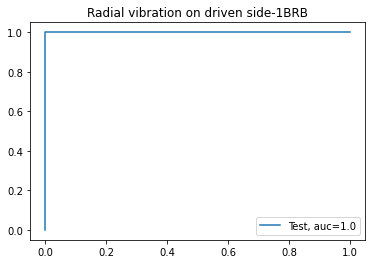

**********************************************************************************
ANN roc_value: 1.0
ANN threshold: 0.9599358029957675
ROC for the test dataset 100.0%


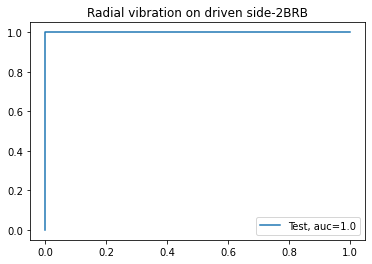

**********************************************************************************
ANN roc_value: 1.0
ANN threshold: 0.9994333693142275
ROC for the test dataset 100.0%


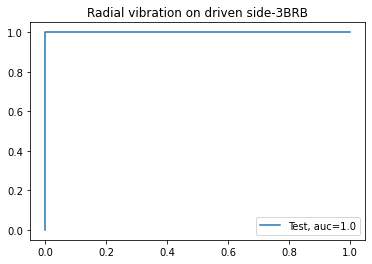

**********************************************************************************
ANN roc_value: 1.0
ANN threshold: 0.9914197807081476
ROC for the test dataset 100.0%


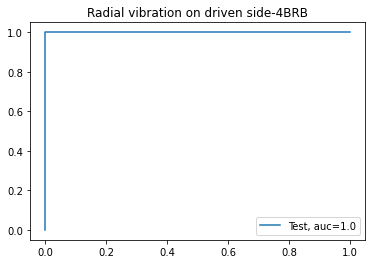

**********************************************************************************


In [136]:
plot_roc(model_ann_acpi, X_test_acpi_1brb, y_test_acpi_1brb, "Radial vibration on driven side-1BRB", "ANN")
plot_roc(model_ann_acpi, X_test_acpi_2brb, y_test_acpi_2brb, "Radial vibration on driven side-2BRB", "ANN")
plot_roc(model_ann_acpi, X_test_acpi_3brb, y_test_acpi_3brb, "Radial vibration on driven side-3BRB", "ANN")
plot_roc(model_ann_acpi, X_test_acpi_4brb, y_test_acpi_4brb, "Radial vibration on driven side-4BRB", "ANN")

ANN
Confusion matrix
[[79  0]
 [ 0 80]]


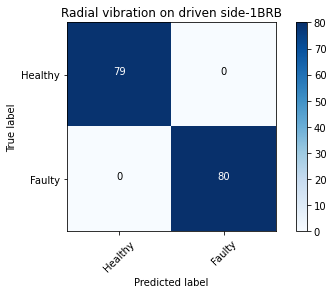

ANN
Confusion matrix
[[79  0]
 [ 0 80]]


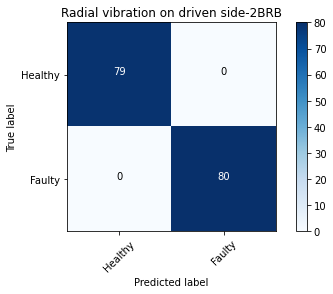

ANN
Confusion matrix
[[79  0]
 [ 0 80]]


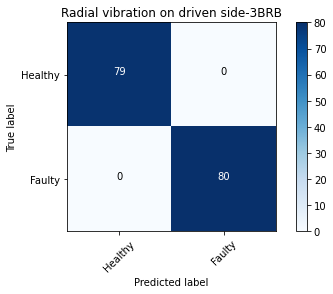

ANN
Confusion matrix
[[79  0]
 [ 0 79]]


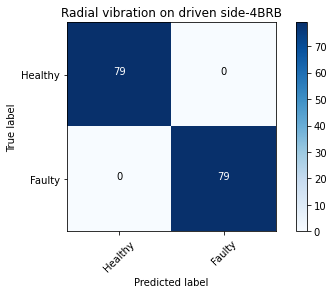

In [148]:
plot_confusion_matrix(model_ann_acpi, X_test_acpi_1brb, y_test_acpi_1brb, "Radial vibration on driven side-1BRB", "ANN", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_ann_acpi, X_test_acpi_2brb, y_test_acpi_2brb, "Radial vibration on driven side-2BRB", "ANN", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_ann_acpi, X_test_acpi_3brb, y_test_acpi_3brb, "Radial vibration on driven side-3BRB", "ANN", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_ann_acpi, X_test_acpi_4brb, y_test_acpi_4brb, "Radial vibration on driven side-4BRB", "ANN", classes=['Healthy', 'Faulty'])


SVC
Confusion matrix
[[77  2]
 [ 9 71]]


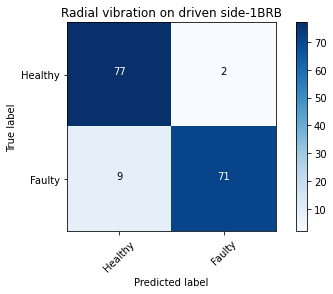

SVC
Confusion matrix
[[77  2]
 [ 0 80]]


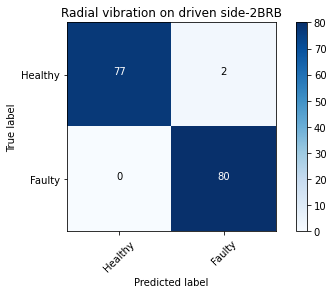

SVC
Confusion matrix
[[77  2]
 [ 0 80]]


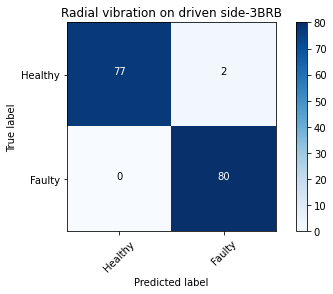

SVC
Confusion matrix
[[77  2]
 [ 0 79]]


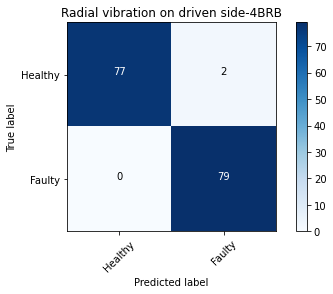

In [147]:
plot_confusion_matrix(model_svc_acpi, X_test_acpi_1brb, y_test_acpi_1brb, "Radial vibration on driven side-1BRB", "SVC", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_svc_acpi, X_test_acpi_2brb, y_test_acpi_2brb, "Radial vibration on driven side-2BRB", "SVC", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_svc_acpi, X_test_acpi_3brb, y_test_acpi_3brb, "Radial vibration on driven side-3BRB", "SVC", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_svc_acpi, X_test_acpi_4brb, y_test_acpi_4brb, "Radial vibration on driven side-4BRB", "SVC", classes=['Healthy', 'Faulty'])


ANN
Confusion matrix
[[78  1]
 [ 0 80]]


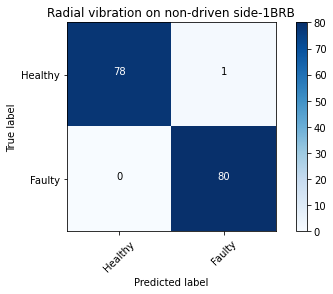

ANN
Confusion matrix
[[78  1]
 [ 0 80]]


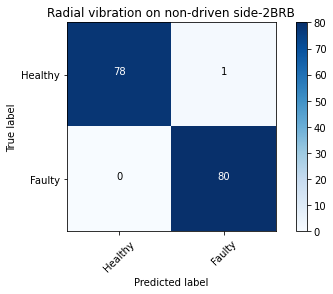

ANN
Confusion matrix
[[78  1]
 [ 1 79]]


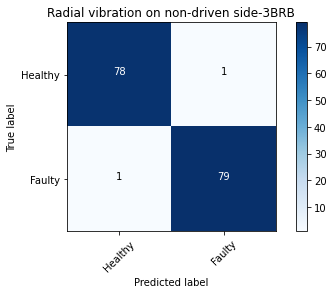

ANN
Confusion matrix
[[78  1]
 [ 0 79]]


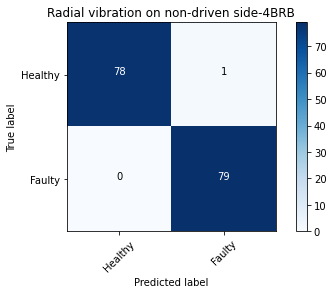

SVC
Confusion matrix
[[79  0]
 [ 8 72]]


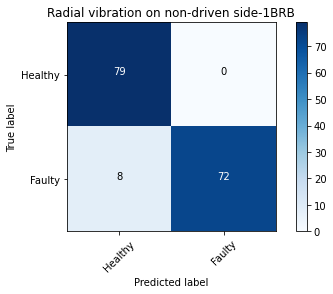

SVC
Confusion matrix
[[79  0]
 [ 0 80]]


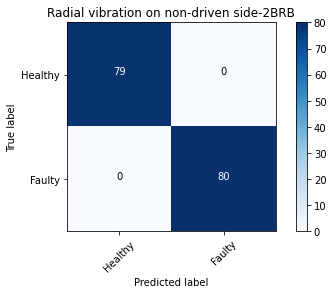

SVC
Confusion matrix
[[79  0]
 [ 7 73]]


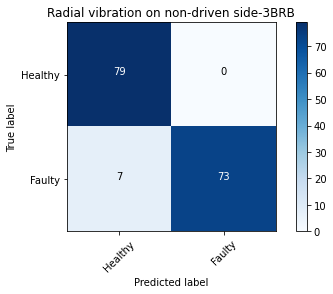

SVC
Confusion matrix
[[79  0]
 [ 0 79]]


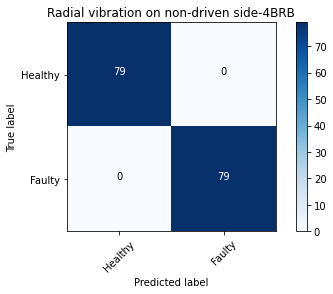

In [149]:
plot_confusion_matrix(model_ann_acpe, X_test_acpe_1brb, y_test_acpe_1brb, "Radial vibration on non-driven side-1BRB", "ANN", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_ann_acpe, X_test_acpe_2brb, y_test_acpe_2brb, "Radial vibration on non-driven side-2BRB", "ANN", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_ann_acpe, X_test_acpe_3brb, y_test_acpe_3brb, "Radial vibration on non-driven side-3BRB", "ANN", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_ann_acpe, X_test_acpe_4brb, y_test_acpe_4brb, "Radial vibration on non-driven side-4BRB", "ANN", classes=['Healthy', 'Faulty'])

plot_confusion_matrix(model_svc_acpe, X_test_acpe_1brb, y_test_acpe_1brb, "Radial vibration on non-driven side-1BRB", "SVC", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_svc_acpe, X_test_acpe_2brb, y_test_acpe_2brb, "Radial vibration on non-driven side-2BRB", "SVC", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_svc_acpe, X_test_acpe_3brb, y_test_acpe_3brb, "Radial vibration on non-driven side-3BRB", "SVC", classes=['Healthy', 'Faulty'])
plot_confusion_matrix(model_svc_acpe, X_test_acpe_4brb, y_test_acpe_4brb, "Radial vibration on non-driven side-4BRB", "SVC", classes=['Healthy', 'Faulty'])
